In [1]:
!pip install fredapi
!pip install --upgrade yfinance curl_cffi

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.9/117.9 kB 2.2 MB/s eta 0:00:00
  Attempting uninstall: yfinance
    Found existing installation: yfinance 0.2.59
    Uninstalling yfinance-0.2.59:
      Successfully uninstalled yfinance-0.2.59


In [2]:
from fredapi import Fred
import pandas as pd

# FRED API Key
fred = Fred(api_key='534b672baa2b3668181fc7b9ddc83492')


series_dict = {
    'unemployment_rate': 'UNRATE',
    'cpi_all_items': 'CPIAUCSL',
    'core_pce': 'PCEPILFE',
    'real_gdp': 'GDPC1',
    'nominal_gdp': 'GDP',
    'federal_funds_rate': 'FEDFUNDS',
    '10y_treasury_yield': 'GS10',
    '3m_treasury_yield': 'GS3M',
    'm2_money_stock': 'M2SL',
    'initial_jobless_claims': 'ICSA',
    'continuing_claims': 'CCSA',
    'average_hourly_earnings': 'CES0500000003',
    'employment_total_nonfarm': 'PAYEMS',
    'case_shiller_us': 'CSUSHPINSA',
    'house_price_index': 'USSTHPI',
    'housing_starts': 'HOUST',
    'total_vehicle_sales': 'TOTALSA',
    'wti_crude_oil': 'DCOILWTICO',
    'brent_crude_oil': 'DCOILBRENTEU',
    'gold_spot_price': 'GOLDAMGBD228NLBM',
    'us_dollar_index': 'DTWEXBGS',
    'usd_jpy': 'DEXJPUS',
    'usd_eur': 'DEXUSEU',
    'usd_cny': 'DEXCHUS',
    'vix_index': 'VIXCLS',
    'pce_inflation': 'PCEPI',
    'personal_income': 'PI',
    'retail_sales': 'RSAFS',
    'industrial_production': 'INDPRO',
    'manufacturing_ip': 'IPMAN',
    'capacity_utilization': 'TCU',
    'business_loans': 'BUSLOANS',
    'credit_card_loans': 'CCLACBW027SBOG',
    'consumer_sentiment': 'UMCSENT',
    'truck_employment': 'CES4348400001',
    'truck_tonnage_index': 'TRUCKD11',
    'heavy_truck_sales': 'HTRUCKSSA',
    'light_truck_sales': 'LTRUCKSAAR',
    'truck_production_ppi': 'PCU3361203361201',
    'used_cars_cpi': 'CUSR0000SETA02',
    'corporate_bond_yield_baa': 'BAA10Y',
    'real_disposable_income': 'DSPIC96',
    'real_personal_consumption': 'PCEC96',
    'personal_savings_rate': 'PSAVERT',
    'michigan_expectations': 'UMCSENTEX',
    'st_louis_fin_stress': 'STLFSI2',
    'core_inflation_services': 'CUSR0000SAS',
    'core_inflation_goods': 'CUSR0000SAG',
    'prime_rate': 'MPRIME'
}


daily_dict = {
    '10y_minus_2y': 'T10Y2Y',
    '10y_minus_3m': 'T10Y3M',
    'federal_funds_effective': 'EFFR',
    'overnight_rp': 'RRPONTSYD',
    '10y_nominal': 'GS10',
    '10y_real': 'DFII10',
    '10y_breakeven': 'T10YIE',
    '5y5y_forward_infl': 'T5YIFR',
    'aaa_corp_yield': 'DAAA',
    'baa_corp_yield': 'DBAA',
    'vix': 'VIXCLS',
    'usd_index_nominal': 'DTWEXB',
    'sofr_30d_avg': 'SOFR30DAYAVG',
    'usd_jpy_spot': 'DEXJPUS',
    'usd_eur_spot': 'DEXUSEU',
    'usd_cny_spot': 'DEXCHUS',
    'nasdaq': 'NASDAQCOM',
    'dow_jones': 'DJIA',
    'sp500': 'SP500',
    'recession_flag': 'USRECDM'  # dummy
}


all_series = {**series_dict, **daily_dict}
start_date = '1980-01-01'
df_all = pd.DataFrame()


for name, code in all_series.items():
    try:
        df_all[name] = fred.get_series(code, observation_start=start_date)
    except Exception as e:
        print(f"❌ Failed to get {name} ({code}): {e}")


df_all.index = pd.to_datetime(df_all.index)
daily_index = pd.date_range(start=start_date, end=pd.to_datetime("today"), freq="D")
df_all = df_all.reindex(daily_index)

# recession_flag
recession_flag = df_all[["recession_flag"]].copy()
recession_flag = recession_flag.fillna(method='ffill')


df_macro = df_all.drop(columns=["recession_flag"])
df_interpolated = pd.DataFrame(index=daily_index)

for col in df_macro.columns:
    series = df_macro[col]
    first_valid = series.first_valid_index()
    if first_valid is not None:
        interpolated = series.copy()
        interpolated.loc[first_valid:] = series.loc[first_valid:].interpolate(method="linear", limit_direction="both")
        df_interpolated[col] = interpolated
    else:
        df_interpolated[col] = series


df_final = pd.concat([df_interpolated, recession_flag], axis=1)


df_final.to_excel("fred_daily_interpolated_with_dummy_preserved.xlsx")
print("✅ Saved to 'fred_daily_interpolated_with_dummy_preserved.xlsx'")


❌ Failed to get gold_spot_price (GOLDAMGBD228NLBM): Bad Request.  The series does not exist.
❌ Failed to get light_truck_sales (LTRUCKSAAR): Bad Request.  The series does not exist.
❌ Failed to get michigan_expectations (UMCSENTEX): Bad Request.  The series does not exist.
❌ Failed to get core_inflation_goods (CUSR0000SAG): Bad Request.  The series does not exist.


<ipython-input-2-baca11a74964>:103: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  recession_flag = recession_flag.fillna(method='ffill')


✅ Saved to 'fred_daily_interpolated_with_dummy_preserved.xlsx'


In [3]:
from curl_cffi import requests
import yfinance as yf


session = requests.Session(impersonate="chrome")


aapl = yf.Ticker("AAPL", session=session)


hist = aapl.history(period="1y", interval="1d")
print(hist.tail())


info = aapl.info
for key in ["marketCap", "trailingPE", "forwardPE", "dividendYield", "beta",
            "earningsQuarterlyGrowth", "industry", "sector", "country", "employees"]:
    print(f"{key}: {info.get(key)}")


                                 Open        High         Low       Close  \
Date                                                                        
2025-05-06 00:00:00-04:00  198.210007  200.649994  197.020004  198.509995   
2025-05-07 00:00:00-04:00  199.169998  199.440002  193.250000  196.250000   
2025-05-08 00:00:00-04:00  197.720001  200.050003  194.679993  197.490005   
2025-05-09 00:00:00-04:00  199.000000  200.539993  197.539993  198.529999   
2025-05-12 00:00:00-04:00  210.970001  211.266495  206.750000  210.789993   

                             Volume  Dividends  Stock Splits  
Date                                                          
2025-05-06 00:00:00-04:00  51216500        0.0           0.0  
2025-05-07 00:00:00-04:00  68536700        0.0           0.0  
2025-05-08 00:00:00-04:00  50478900        0.0           0.0  
2025-05-09 00:00:00-04:00  36415700        0.0           0.0  
2025-05-12 00:00:00-04:00  63024455        0.0           0.0  
marketCap: 31483171

In [4]:
import yfinance as yf
import pandas as pd


tickers = [
    #
    'AAPL', 'MSFT', 'GOOGL', 'META', 'AMZN', 'NVDA', 'TSLA',
    #
    'GC=F', 'CL=F', 'NG=F', 'ZW=F', 'ZC=F', 'ZS=F',
    '^IXIC', '^GSPC', '^DJI',
    #
    'XOM', 'GE', 'IBM', 'JNJ', 'PG', 'WMT', 'KO', 'INTC', 'ORCL', 'CVX',
    #
    'BTC-USD', 'ETH-USD', 'SOL-USD', 'BNB-USD', 'DOGE-USD'
]

data = yf.download(tickers, period="45y", interval="1d", group_by="ticker", auto_adjust=True)
close_df = pd.DataFrame({ticker: data[ticker]['Close'] for ticker in tickers})


print(close_df.tail())




[*********************100%***********************]  31 of 31 completed


                  AAPL        MSFT       GOOGL        META        AMZN  \
Date                                                                     
2025-05-09  198.529999  438.730011  152.750000  592.489990  193.059998   
2025-05-10         NaN         NaN         NaN         NaN         NaN   
2025-05-11         NaN         NaN         NaN         NaN         NaN   
2025-05-12  210.789993  449.260010  158.460007  639.429993  208.639999   
2025-05-13         NaN         NaN         NaN         NaN         NaN   

                  NVDA        TSLA         GC=F       CL=F   NG=F  ...  \
Date                                                               ...   
2025-05-09  116.650002  298.260010  3335.399902  61.020000  3.795  ...   
2025-05-10         NaN         NaN          NaN        NaN    NaN  ...   
2025-05-11         NaN         NaN          NaN        NaN    NaN  ...   
2025-05-12  123.000000  318.380005  3235.899902  61.900002  3.700  ...   
2025-05-13         NaN         NaN   

In [5]:
close_df.to_csv("market_data_total_last45y_close.csv")

In [6]:
import pandas as pd


fred_df = pd.read_excel("fred_daily_interpolated_with_dummy_preserved.xlsx", index_col=0, parse_dates=True)
market_df = pd.read_csv("market_data_total_last45y_close.csv", index_col=0, parse_dates=True)


combined_df = pd.concat([fred_df, market_df], axis=1)


combined_df.to_excel("final_combined_data.xlsx")



In [7]:
import yfinance as yf
import pandas as pd


tickers = [
    'AAPL', 'MSFT', 'GOOGL', 'META', 'AMZN', 'NVDA', 'TSLA',
    'GC=F', 'CL=F', 'NG=F', 'ZW=F', 'ZC=F', 'ZS=F',
    '^IXIC', '^GSPC', '^DJI',
    'XOM', 'GE', 'IBM', 'JNJ', 'PG', 'WMT', 'KO', 'INTC', 'ORCL', 'CVX',
    'BTC-USD', 'ETH-USD', 'SOL-USD', 'BNB-USD', 'DOGE-USD'
]


data = yf.download(tickers, period="45y", interval="1d", group_by="ticker", auto_adjust=True)


close_df = pd.DataFrame({ticker: data[ticker]['Close'] for ticker in tickers})


close_df.index = pd.to_datetime(close_df.index)


full_index = pd.date_range(start=close_df.index.min(), end=close_df.index.max(), freq='D')
close_df = close_df.reindex(full_index)


close_df_interpolated = close_df.interpolate(method='linear', limit_direction='both', limit_area='inside')


close_df_interpolated.to_excel("market_close_data_interpolated.xlsx")


[*********************100%***********************]  31 of 31 completed


In [8]:
import pandas as pd


macro_df = pd.read_excel("fred_daily_interpolated_with_dummy_preserved.xlsx", index_col=0, parse_dates=True)
market_df = pd.read_excel("market_close_data_interpolated.xlsx", index_col=0, parse_dates=True)


combined_df = pd.merge(macro_df, market_df, left_index=True, right_index=True, how='outer')


combined_df.to_excel("combined_macro_market_data.xlsx")


In [9]:
import pandas as pd

econ_data = '/content/combined_macro_market_data.xlsx'
df = pd.read_excel(econ_data)
df.head()


,Unnamed: 0,unemployment_rate,cpi_all_items,core_pce,real_gdp,nominal_gdp,federal_funds_rate,10y_treasury_yield,3m_treasury_yield,m2_money_stock,...,WMT,KO,INTC,ORCL,CVX,BTC-USD,ETH-USD,SOL-USD,BNB-USD,DOGE-USD
0,1980-01-01,6.3,78.000000,36.315000,7341.557000,2789.842000,13.82,10.800000,NaN,1482.700000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1980-01-02,6.3,78.032258,36.326677,7339.894714,2789.924527,13.83,10.851935,NaN,1483.083871,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1980-01-03,6.3,78.064516,36.338355,7338.232429,2790.007055,13.84,10.903871,NaN,1483.467742,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1980-01-04,6.3,78.096774,36.350032,7336.570143,2790.089582,13.85,10.955806,NaN,1483.851613,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1980-01-05,6.3,78.129032,36.361710,7334.907857,2790.172110,13.86,11.007742,NaN,1484.235484,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16570 entries, 0 to 16569
Data columns (total 97 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Unnamed: 0                 16570 non-null  datetime64[ns]
 1   unemployment_rate          16570 non-null  float64       
 2   cpi_all_items              16570 non-null  float64       
 3   core_pce                   16570 non-null  float64       
 4   real_gdp                   16570 non-null  float64       
 5   nominal_gdp                16570 non-null  float64       
 6   federal_funds_rate         16570 non-null  float64       
 7   10y_treasury_yield         16570 non-null  float64       
 8   3m_treasury_yield          15961 non-null  float64       
 9   m2_money_stock             16570 non-null  float64       
 10  initial_jobless_claims     16510 non-null  float64       
 11  continuing_claims          16510 non-null  float64       
 12  aver

In [11]:
import pandas as pd


tariff_dict = {
    1980: 3.10, 1981: 3.40, 1982: 3.60, 1983: 3.70, 1984: 3.70,
    1985: 3.80, 1986: 3.60, 1987: 3.50, 1988: 3.40, 1989: 3.40,
    1990: 3.30, 1991: 3.40, 1992: 3.30, 1993: 3.20, 1994: 3.00,
    1995: 2.50, 1996: 2.30, 1997: 2.10, 1998: 2.00, 1999: 1.80,
    2000: 1.60, 2001: 1.60, 2002: 1.70, 2003: 1.60, 2004: 1.50,
    2005: 1.40, 2006: 1.40, 2007: 1.30, 2008: 1.20, 2009: 1.40,
    2010: 1.40, 2011: 1.30, 2012: 1.30, 2013: 1.40, 2014: 1.40,
    2015: 1.50, 2016: 1.50, 2017: 1.40, 2018: 1.80, 2019: 2.70,
    2020: 2.80, 2021: 3.00, 2022: 2.80, 2023: 2.40, 2024: 2.50,
    2025: 11.50  # Trump's proposed
}


df_tariff_yearly = pd.DataFrame(list(tariff_dict.items()), columns=["year", "avg_tariff_rate"])
df_tariff_yearly["date"] = pd.to_datetime(df_tariff_yearly["year"].astype(str) + "-01-01")
df_tariff_yearly.set_index("date", inplace=True)
df_tariff_yearly.drop(columns="year", inplace=True)


full_dates = pd.date_range(start="1980-01-01", end=pd.to_datetime("today"), freq="D")
df_tariff_daily = df_tariff_yearly.reindex(full_dates)
df_tariff_daily.index.name = "date"


df_tariff_daily = df_tariff_daily[df_tariff_daily.notnull().any(axis=1).cummax()]  # 去掉开始前空值
df_tariff_daily_interpolated = df_tariff_daily.interpolate(method="linear", limit_direction="forward")


macro_path = "/content/combined_macro_market_data.xlsx"
df_macro = pd.read_excel(macro_path, index_col=0, parse_dates=True)


df_merged = df_macro.join(df_tariff_daily_interpolated, how="left")


output_path = "final_combined_data_with_tariff.xlsx"
df_merged.to_excel(output_path)



In [12]:
fecon_data = 'final_combined_data_with_tariff.xlsx'
df = pd.read_excel(fecon_data)
df.head()

,Unnamed: 0,unemployment_rate,cpi_all_items,core_pce,real_gdp,nominal_gdp,federal_funds_rate,10y_treasury_yield,3m_treasury_yield,m2_money_stock,...,KO,INTC,ORCL,CVX,BTC-USD,ETH-USD,SOL-USD,BNB-USD,DOGE-USD,avg_tariff_rate
0,1980-01-01,6.3,78.000000,36.315000,7341.557000,2789.842000,13.82,10.800000,NaN,1482.700000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.100000
1,1980-01-02,6.3,78.032258,36.326677,7339.894714,2789.924527,13.83,10.851935,NaN,1483.083871,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.100820
2,1980-01-03,6.3,78.064516,36.338355,7338.232429,2790.007055,13.84,10.903871,NaN,1483.467742,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.101639
3,1980-01-04,6.3,78.096774,36.350032,7336.570143,2790.089582,13.85,10.955806,NaN,1483.851613,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.102459
4,1980-01-05,6.3,78.129032,36.361710,7334.907857,2790.172110,13.86,11.007742,NaN,1484.235484,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.103279


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16570 entries, 0 to 16569
Data columns (total 98 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Unnamed: 0                 16570 non-null  datetime64[ns]
 1   unemployment_rate          16570 non-null  float64       
 2   cpi_all_items              16570 non-null  float64       
 3   core_pce                   16570 non-null  float64       
 4   real_gdp                   16570 non-null  float64       
 5   nominal_gdp                16570 non-null  float64       
 6   federal_funds_rate         16570 non-null  float64       
 7   10y_treasury_yield         16570 non-null  float64       
 8   3m_treasury_yield          15961 non-null  float64       
 9   m2_money_stock             16570 non-null  float64       
 10  initial_jobless_claims     16510 non-null  float64       
 11  continuing_claims          16510 non-null  float64       
 12  aver

In [14]:
df.describe()

,Unnamed: 0,unemployment_rate,cpi_all_items,core_pce,real_gdp,nominal_gdp,federal_funds_rate,10y_treasury_yield,3m_treasury_yield,m2_money_stock,...,KO,INTC,ORCL,CVX,BTC-USD,ETH-USD,SOL-USD,BNB-USD,DOGE-USD,avg_tariff_rate
count,16570,16570.000000,16570.000000,16570.000000,16570.000000,16570.000000,16570.000000,16570.000000,15961.000000,16570.000000,...,16436.000000,16436.000000,14307.000000,16436.000000,3892.000000,2743.000000,1860.000000,2743.000000,2743.000000,16570.000000
mean,2002-09-06 12:00:00,6.043570,185.614442,78.604832,14543.978523,12479.226057,4.415006,5.643435,3.816540,7777.958932,...,18.141886,15.116475,25.571970,38.958184,22074.709380,1535.229889,75.558232,239.067908,0.084693,2.521497
min,1980-01-01 00:00:00,3.400000,78.000000,36.315000,7181.743000,2789.842000,0.050000,0.620000,0.010000,1482.700000,...,0.180812,0.120516,0.033532,1.162517,178.102997,84.308296,0.515273,1.510360,0.001038,1.200000
25%,1991-05-05 06:00:00,4.635484,135.654839,62.325508,10085.644170,6156.623745,1.004266,2.944403,0.912903,3344.220161,...,3.494986,0.837167,2.643072,5.127107,1846.199951,288.021759,19.255631,17.244488,0.002921,1.472074
50%,2002-09-06 12:00:00,5.661290,180.873333,77.984100,14532.800636,11040.822908,4.330000,4.764581,3.970000,5670.695000,...,13.314513,12.927545,13.954369,18.386788,9738.791016,1556.872681,38.905603,240.498795,0.063234,2.320548
75%,2014-01-08 18:00:00,7.225188,235.037444,95.075250,18009.386190,17225.359861,6.211331,7.526390,5.636667,11134.000000,...,28.235533,22.747952,34.512497,67.393784,35825.954102,2458.725220,139.479778,399.337280,0.128673,3.337808
max,2025-05-13 00:00:00,14.800000,319.775000,125.052000,23542.349000,29977.632000,19.100000,15.320000,15.610000,21762.500000,...,73.900002,62.083336,191.271088,171.327377,106146.265625,4812.087402,261.869751,750.272644,0.684777,11.500000
std,NaN,1.799867,61.805163,21.843611,4723.218748,7226.311925,3.920770,3.305588,3.131451,5894.100753,...,17.442558,14.662621,32.860850,42.260562,25494.607641,1220.102260,70.984423,224.866619,0.102122,1.423824


🔍 Preview of dataset:


,unemployment_rate,cpi_all_items,core_pce,real_gdp,nominal_gdp,federal_funds_rate,10y_treasury_yield,3m_treasury_yield,m2_money_stock,initial_jobless_claims,...,KO,INTC,ORCL,CVX,BTC-USD,ETH-USD,SOL-USD,BNB-USD,DOGE-USD,avg_tariff_rate
1980-01-01,6.3,78.000000,36.315000,7341.557000,2789.842000,13.82,10.800000,NaN,1482.700000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.100000
1980-01-02,6.3,78.032258,36.326677,7339.894714,2789.924527,13.83,10.851935,NaN,1483.083871,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.100820
1980-01-03,6.3,78.064516,36.338355,7338.232429,2790.007055,13.84,10.903871,NaN,1483.467742,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.101639
1980-01-04,6.3,78.096774,36.350032,7336.570143,2790.089582,13.85,10.955806,NaN,1483.851613,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.102459
1980-01-05,6.3,78.129032,36.361710,7334.907857,2790.172110,13.86,11.007742,NaN,1484.235484,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.103279



📏 Dataset shape: (16570, 97)
🧪 Missing value summary:


,0
SOL-USD,14710
sofr_30d_avg,14031
BNB-USD,13827
DOGE-USD,13827
ETH-USD,13827
dow_jones,12935
sp500,12935
BTC-USD,12678
META,11827
TSLA,11138



📊 Descriptive statistics:


<ipython-input-15-1add8b0bc9a6>:21: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_cleaned.fillna(method='ffill', inplace=True)


,mean,std,min,max
unemployment_rate,6.043570,1.799867,3.400000,14.800000
cpi_all_items,185.614442,61.805163,78.000000,319.775000
core_pce,78.604832,21.843611,36.315000,125.052000
real_gdp,14543.978523,4723.218748,7181.743000,23542.349000
nominal_gdp,12479.226057,7226.311925,2789.842000,29977.632000
...,...,...,...,...
ETH-USD,1535.229889,1220.102260,84.308296,4812.087402
SOL-USD,75.558232,70.984423,0.515273,261.869751
BNB-USD,239.067908,224.866619,1.510360,750.272644
DOGE-USD,0.084693,0.102122,0.001038,0.684777


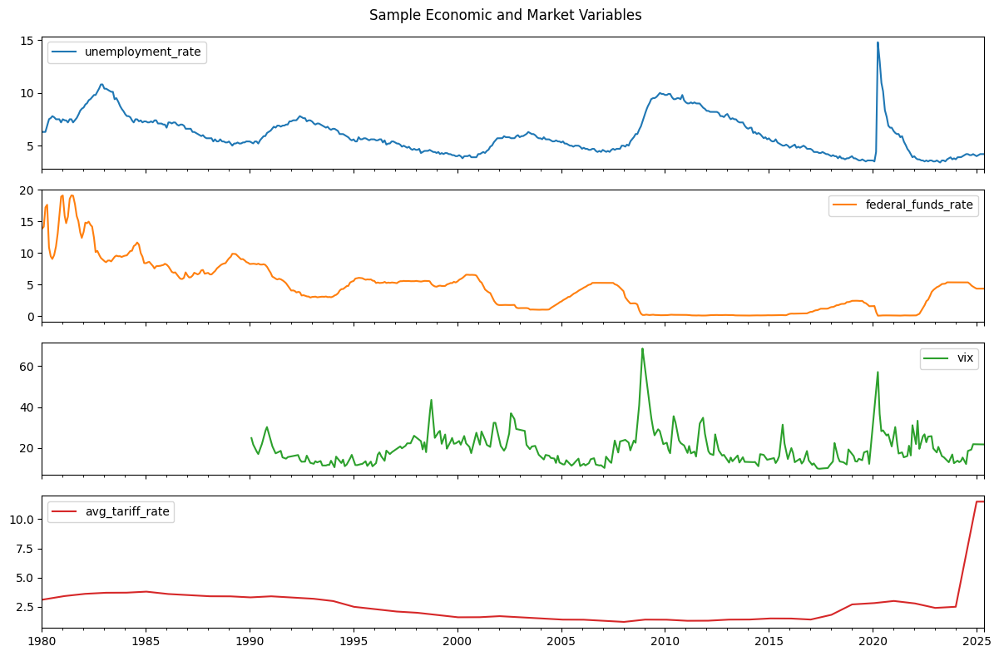

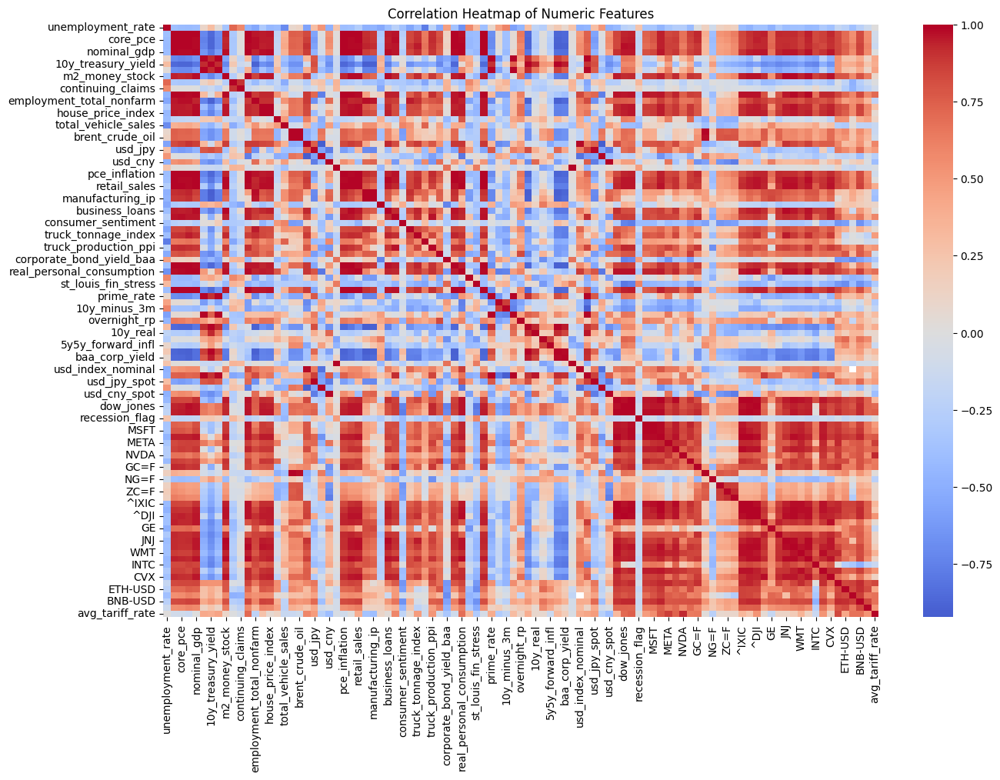

In [15]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


fecon_data = 'final_combined_data_with_tariff.xlsx'
df = pd.read_excel(fecon_data, index_col=0, parse_dates=True)


print("🔍 Preview of dataset:")
display(df.head())


print("\n📏 Dataset shape:", df.shape)
print("🧪 Missing value summary:")
display(df.isnull().sum().sort_values(ascending=False).head(10))


df_cleaned = df.copy()
df_cleaned.fillna(method='ffill', inplace=True)


print("\n📊 Descriptive statistics:")
display(df_cleaned.describe().T[['mean', 'std', 'min', 'max']])


sample_cols = ['unemployment_rate', 'federal_funds_rate', 'vix', 'avg_tariff_rate']
df_cleaned[sample_cols].plot(subplots=True, figsize=(12, 8), title='Sample Economic and Market Variables')
plt.tight_layout()
plt.show()


plt.figure(figsize=(15, 10))
sns.heatmap(df_cleaned.corr(numeric_only=True), cmap='coolwarm', center=0, annot=False)
plt.title("Correlation Heatmap of Numeric Features")
plt.show()


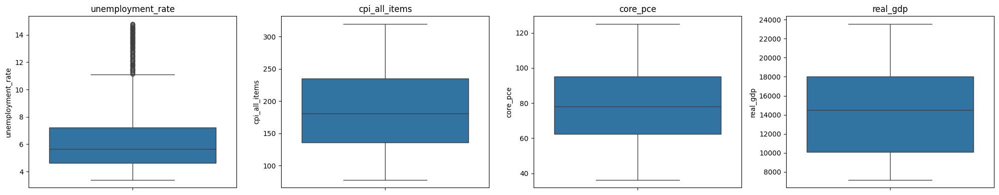

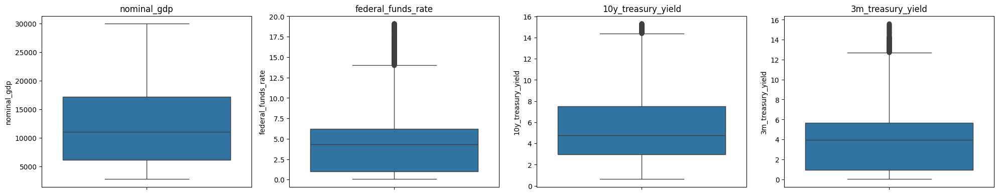

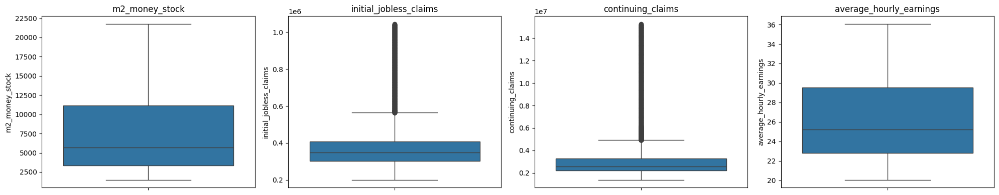

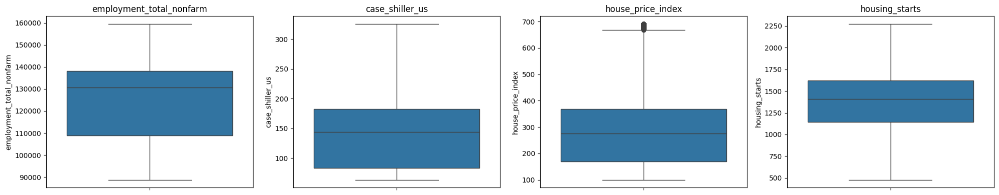

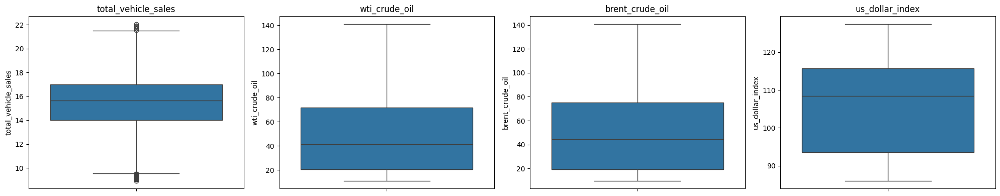

...

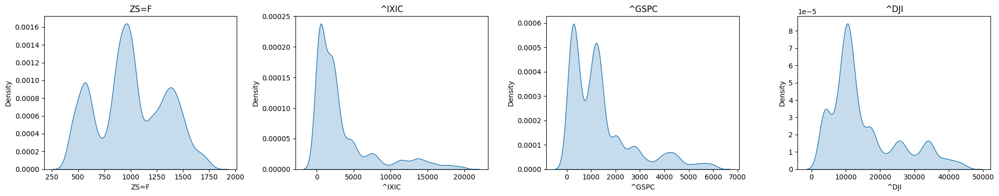

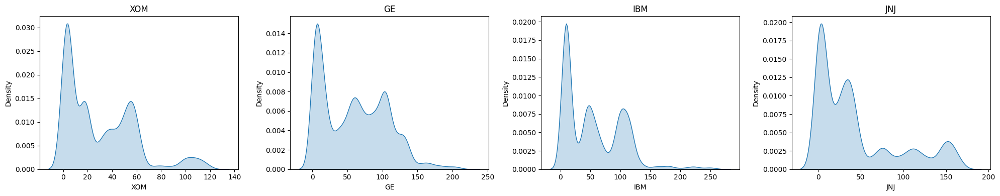

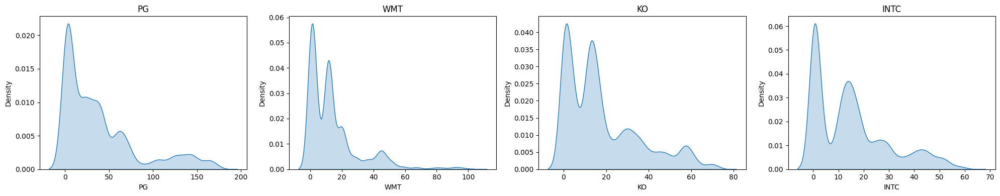

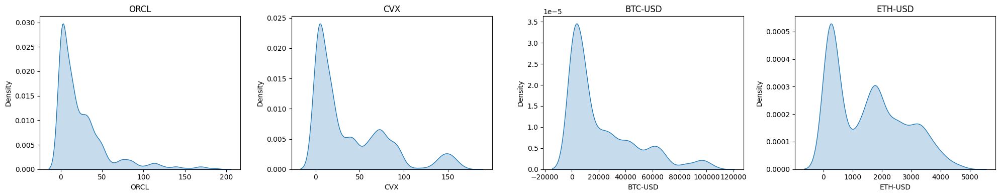

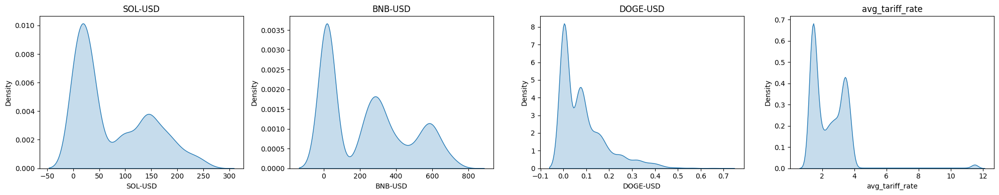

In [16]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


df = pd.read_excel('final_combined_data_with_tariff.xlsx', index_col=0, parse_dates=True)


plot_vars = df.select_dtypes(include='number').columns.tolist()
plot_vars.remove('recession_flag')


def plot_grid(data, kind='box', cols=4, figsize=(20, 4)):
    n = len(data)
    rows = (n + cols - 1) // cols
    for i in range(rows):
        fig, axs = plt.subplots(1, cols, figsize=figsize)
        for j in range(cols):
            idx = i * cols + j
            if idx >= n:
                axs[j].axis('off')
                continue
            col = data[idx]
            if kind == 'box':
                sns.boxplot(y=df[col], ax=axs[j])
            elif kind == 'violin':
                sns.violinplot(y=df[col], ax=axs[j])
            elif kind == 'hist':
                sns.histplot(df[col].dropna(), bins=40, kde=False, ax=axs[j])
            elif kind == 'kde':
                sns.kdeplot(df[col].dropna(), ax=axs[j], fill=True)
            axs[j].set_title(col)
        plt.tight_layout()
        plt.show()


plot_grid(plot_vars, kind='box')
plot_grid(plot_vars, kind='violin')
plot_grid(plot_vars, kind='hist')
plot_grid(plot_vars, kind='kde')


In [17]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.inspection import permutation_importance


df = pd.read_excel("final_combined_data_with_tariff.xlsx", index_col=0, parse_dates=True)


df = df.dropna()


y = df['sp500']


X = df[[
    'unemployment_rate', 'cpi_all_items', 'federal_funds_rate',
    'm2_money_stock', 'recession_flag', 'avg_tariff_rate'
]]


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)


lr = LinearRegression()
lr.fit(X_train, y_train)


y_pred_train = lr.predict(X_train)
y_pred_test = lr.predict(X_test)


print("📉 Train MSE:", mean_squared_error(y_train, y_pred_train))
print("📉 Test MSE:", mean_squared_error(y_test, y_pred_test))
print("📈 Test R^2 Score:", r2_score(y_test, y_pred_test))


coef_df = pd.DataFrame({
    "Variable": X.columns,
    "Coefficient": lr.coef_
}).sort_values("Coefficient", key=abs, ascending=False)
print("\n📌 Coefficients:")
print(coef_df)


r = permutation_importance(lr, X_test, y_test, n_repeats=10, random_state=0)
importance_df = pd.DataFrame(r.importances_mean, index=X.columns, columns=["Importance"])
print("\n📊 Permutation Importance:")
print(importance_df.sort_values("Importance", ascending=False))


📉 Train MSE: 52134.00485384759
📉 Test MSE: 3833049.4197227117
📈 Test R^2 Score: -146.6249542061979

📌 Coefficients:
             Variable  Coefficient
5     avg_tariff_rate   427.948344
0   unemployment_rate  -101.659077
4      recession_flag    -8.511307
1       cpi_all_items     4.661933
2  federal_funds_rate     0.223427
3      m2_money_stock     0.136894

📊 Permutation Importance:
                    Importance
avg_tariff_rate       5.888852
unemployment_rate     0.019930
federal_funds_rate    0.005434
recession_flag        0.000000
cpi_all_items        -0.669449
m2_money_stock       -1.903021


In [18]:
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score


features = ['avg_tariff_rate', 'unemployment_rate', 'federal_funds_rate', 'cpi_all_items', 'm2_money_stock', 'recession_flag']
target = 'sp500'

X = df[features]
y = df[target]


X = X[y.notna()]
y = y[y.notna()]


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)


pipe = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),    #
    ('scaler', StandardScaler()),                   #
    ('regressor', LinearRegression())               #
])


pipe.fit(X_train, y_train)


y_pred = pipe.predict(X_test)


print("📉 Test MSE:", mean_squared_error(y_test, y_pred))
print("📈 Test R^2 Score:", r2_score(y_test, y_pred))



📉 Test MSE: 63231.6868616384
📈 Test R^2 Score: 0.8904880666366695


In [19]:
pipe.fit(X_train, y_train)

Pipeline(steps=[('imputer', SimpleImputer()), ('scaler', StandardScaler()),
                ('regressor', LinearRegression())])

📉 Train MSE: 96.98231193626073
📉 Test MSE: 94.24242589688458
📈 Test R2: 0.9998293620475828

📌 Top Coefficients:


,Feature,Coefficient
27,standardscaler__pce_inflation,2494.183802
4,standardscaler__cpi_all_items,-2175.054893
17,standardscaler__house_price_index,1737.024573
7,standardscaler__nominal_gdp,1691.184612
12,standardscaler__initial_jobless_claims,-1548.907459
46,standardscaler__core_inflation_services,-1499.806974
44,standardscaler__personal_savings_rate,-1472.299097
15,standardscaler__employment_total_nonfarm,-1316.756492
13,standardscaler__continuing_claims,1272.616328
5,standardscaler__core_pce,1091.698754


<ipython-input-20-0e32199b0c62>:80: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Coefficient', y='Feature', data=coef_df.head(25), palette='coolwarm')


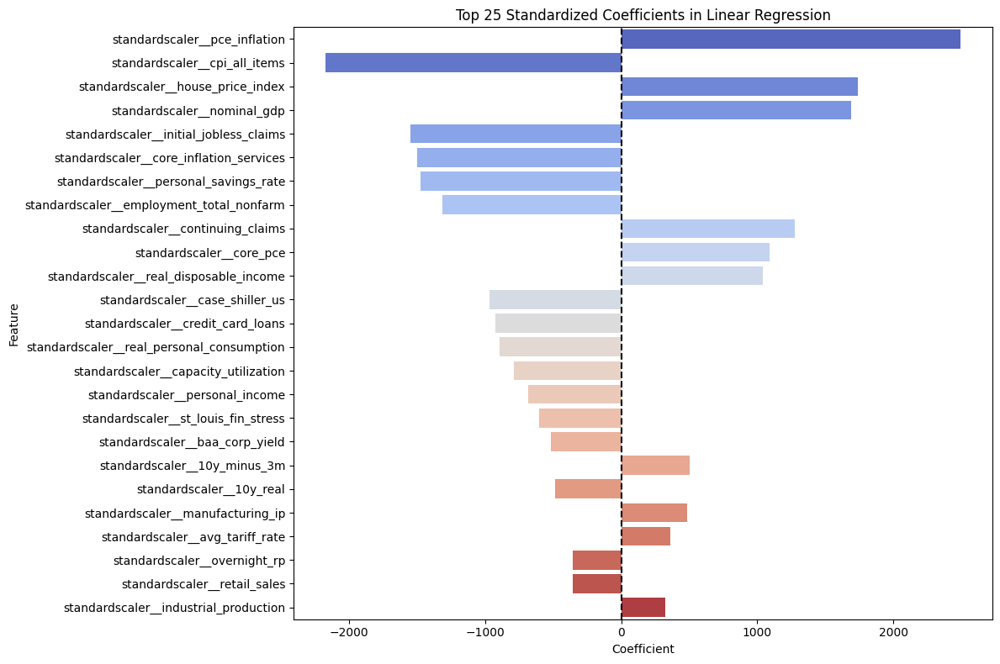

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


df = pd.read_excel('final_combined_data_with_tariff.xlsx', index_col=0, parse_dates=True)


df = df.dropna()


df['quarter'] = df.index.to_period('Q').astype(str).str[-2:]  # 'Q1', 'Q2', ...


target = 'sp500'
exclude_cols = ['sp500', 'dow_jones','nasdaq','recession_flag', 'quarter']
macro_features = [col for col in df.columns if col not in exclude_cols and not col.startswith(('^', 'AAPL', 'MSFT', 'BTC', 'ETH', 'DOGE', 'GOOGL', 'META', 'AMZN', 'NVDA', 'TSLA', 'BNB', 'SOL', 'XOM', 'GE', 'JNJ', 'PG', 'WMT', 'KO', 'INTC', 'ORCL', 'CVX', 'IBM', 'GC=', 'CL=', 'NG=', 'ZW=', 'ZS=', 'ZC='))]
if 'quarter' not in macro_features:
    macro_features.append('quarter')


X = df[macro_features]
y = df[target]


cat_cols = ['quarter']
num_cols = [col for col in X.columns if col not in cat_cols]


preprocessor = make_column_transformer(
    (OneHotEncoder(drop='first'), cat_cols),
    (StandardScaler(), num_cols)
)

linreg_pipe = Pipeline([
    ('preprocessing', preprocessor),
    ('model', LinearRegression())
])


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


linreg_pipe.fit(X_train, y_train)


y_pred = linreg_pipe.predict(X_test)


rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"📉 Train MSE: {mean_squared_error(y_train, linreg_pipe.predict(X_train))}")
print(f"📉 Test MSE: {mean_squared_error(y_test, y_pred)}")
print(f"📈 Test R2: {r2}")


feature_names = linreg_pipe.named_steps['preprocessing'].get_feature_names_out()
coefficients = linreg_pipe.named_steps['model'].coef_

coef_df = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': coefficients
}).sort_values(by='Coefficient', key=abs, ascending=False)

print("\n📌 Top Coefficients:")
display(coef_df.head(10))


plt.figure(figsize=(12, 8))
sns.barplot(x='Coefficient', y='Feature', data=coef_df.head(25), palette='coolwarm')
plt.title('Top 25 Standardized Coefficients in Linear Regression')
plt.axvline(0, color='black', linestyle='--')
plt.tight_layout()
plt.show()


In [21]:
import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.inspection import permutation_importance


df = pd.read_excel("final_combined_data_with_tariff.xlsx", index_col=0, parse_dates=True)


df['quarter'] = df.index.to_period('Q').astype(str).str[-2:]


df = df.dropna()


macro_cols = [
    col for col in df.columns if col not in ['sp500', 'dow_jones','nasdaq','recession_flag', 'quarter'] and not any(tk in col for tk in [
        'AAPL','MSFT','GOOGL','META','AMZN','NVDA','TSLA',
        'GC=F','CL=F','NG=F','ZW=F','ZC=F','ZS=F',
        '^IXIC','^GSPC','^DJI',
        'BTC-USD','ETH-USD','SOL-USD','BNB-USD','DOGE-USD'
    ])
]

X = df[macro_cols + ['quarter']]
y = df['sp500']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


cat_cols = ['quarter']
num_cols = [col for col in X.columns if col not in cat_cols]


preprocessor = make_column_transformer(
    (OneHotEncoder(drop='first'), cat_cols),
    (StandardScaler(), num_cols)
)


pipe = Pipeline([
    ('preprocessing', preprocessor),
    ('model', KNeighborsRegressor())
])


param_grid = {'model__n_neighbors': [5, 10, 15, 20]}
grid = GridSearchCV(pipe, param_grid, cv=5, scoring='neg_mean_squared_error')
grid.fit(X_train, y_train)


best_knn = grid.best_estimator_
y_pred = best_knn.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print("📊 Best Params:", grid.best_params_)
print(f"📉 Test RMSE: {rmse:.2f}")
print(f"📈 Test R²: {r2:.4f}")


📊 Best Params: {'model__n_neighbors': 5}
📉 Test RMSE: 6.34
📈 Test R²: 0.9999


In [22]:
import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


df = pd.read_excel("final_combined_data_with_tariff.xlsx", index_col=0, parse_dates=True)


df['quarter'] = df.index.to_period('Q').astype(str).str[-2:]


df = df.dropna()


macro_cols = [
    col for col in df.columns if col not in ['sp500', 'dow_jones','nasdaq','recession_flag', 'quarter'] and not any(tk in col for tk in [
        'AAPL','MSFT','GOOGL','META','AMZN','NVDA','TSLA',
        'GC=F','CL=F','NG=F','ZW=F','ZC=F','ZS=F',
        '^IXIC','^GSPC','^DJI',
        'BTC-USD','ETH-USD','SOL-USD','BNB-USD','DOGE-USD'
    ])
]

X = df[macro_cols + ['quarter']]
y = df['sp500']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


cat_cols = ['quarter']
num_cols = [col for col in X.columns if col not in cat_cols]

preprocessor = make_column_transformer(
    (OneHotEncoder(drop='first'), cat_cols),
    (StandardScaler(), num_cols)
)


pipe = Pipeline([
    ('preprocessing', preprocessor),
    ('model', KNeighborsRegressor())
])

param_grid = {'model__n_neighbors': [5, 10, 15, 20]}
grid = GridSearchCV(pipe, param_grid, cv=5, scoring='neg_mean_squared_error')
grid.fit(X_train, y_train)


best_knn = grid.best_estimator_
y_train_pred = best_knn.predict(X_train)
y_test_pred = best_knn.predict(X_test)

train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

print(f"📉 Train MSE: {train_mse:.2f}")
print(f"📉 Test MSE: {test_mse:.2f}")
print(f"📉 Train MAE: {train_mae:.2f}")
print(f"📉 Test MAE: {test_mae:.2f}")
print(f"📈 Test R²: {test_r2:.4f}")
print("📌 Best Params:", grid.best_params_)


📉 Train MSE: 25.60
📉 Test MSE: 40.18
📉 Train MAE: 3.10
📉 Test MAE: 4.07
📈 Test R²: 0.9999
📌 Best Params: {'model__n_neighbors': 5}


<ipython-input-23-62862b85c804>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=importance_df, palette='viridis')
<ipython-input-23-62862b85c804>:32: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


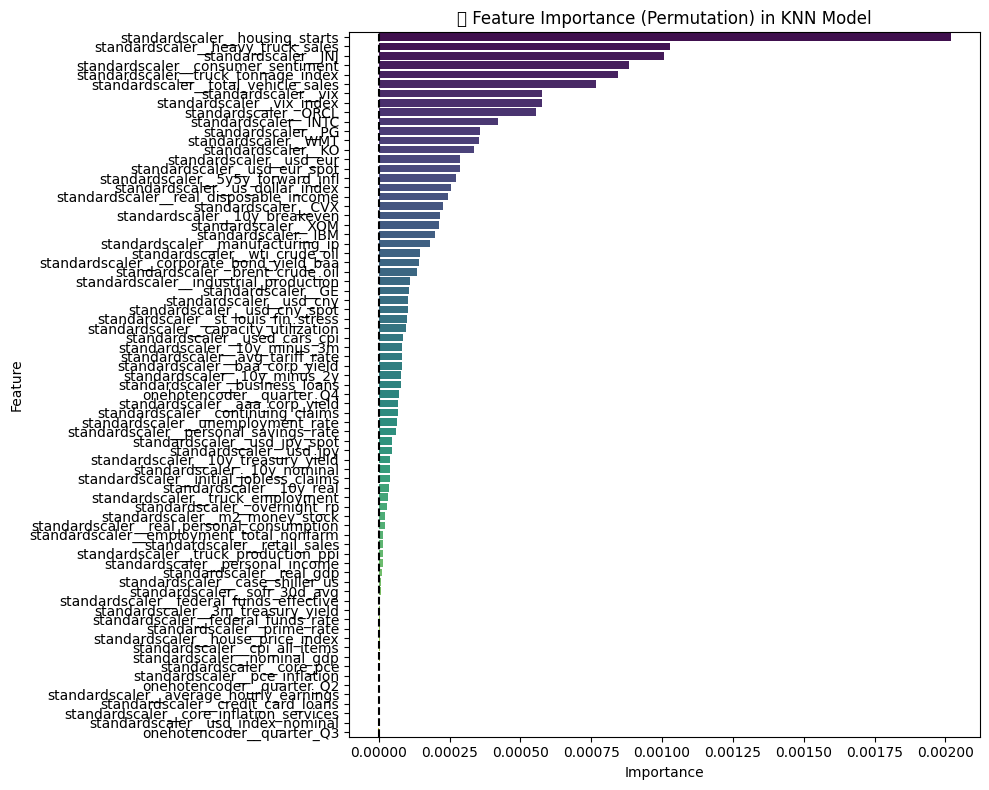

,Feature,Importance
18,standardscaler__housing_starts,2.020864e-03
38,standardscaler__heavy_truck_sales,1.027772e-03
67,standardscaler__JNJ,1.007063e-03
35,standardscaler__consumer_sentiment,8.847404e-04
37,standardscaler__truck_tonnage_index,8.434030e-04
...,...,...
14,standardscaler__average_hourly_earnings,1.797116e-06
34,standardscaler__credit_card_loans,1.142548e-06
46,standardscaler__core_inflation_services,9.822128e-07
59,standardscaler__usd_index_nominal,0.000000e+00


In [23]:
from sklearn.inspection import permutation_importance
from sklearn.base import clone


X_test_processed = best_knn.named_steps['preprocessing'].transform(X_test)
X_train_processed = best_knn.named_steps['preprocessing'].transform(X_train)
feature_names = best_knn.named_steps['preprocessing'].get_feature_names_out()


model_only = best_knn.named_steps['model']
model_only_clone = clone(model_only)
model_only_clone.fit(X_train_processed, y_train)


from sklearn.inspection import permutation_importance
result = permutation_importance(model_only_clone, X_test_processed, y_test, n_repeats=10, random_state=42)


importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': result.importances_mean
}).sort_values(by='Importance', ascending=False)


import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=importance_df, palette='viridis')
plt.title("📊 Feature Importance (Permutation) in KNN Model")
plt.axvline(0, color='black', linestyle='--')
plt.tight_layout()
plt.show()


display(importance_df)



📊 Best Params: {'model__max_depth': 10, 'model__n_estimators': 100}
📉 Train MSE: 18.41
📉 Test MSE: 37.91
📉 Train MAE: 2.42
📉 Test MAE: 3.83
📈 R²: 1.000

📌 Feature Importance:


,Feature,Importance
27,standardscaler__pce_inflation,1.826144e-01
6,standardscaler__real_gdp,1.578166e-01
15,standardscaler__employment_total_nonfarm,9.394567e-02
5,standardscaler__core_pce,6.150934e-02
3,standardscaler__unemployment_rate,5.585220e-02
...,...,...
1,onehotencoder__quarter_Q3,8.419879e-05
67,standardscaler__JNJ,7.820835e-05
73,standardscaler__CVX,5.680046e-05
2,onehotencoder__quarter_Q4,7.013793e-08


<ipython-input-24-1a127a016691>:96: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=importance_df.head(20), palette='viridis')


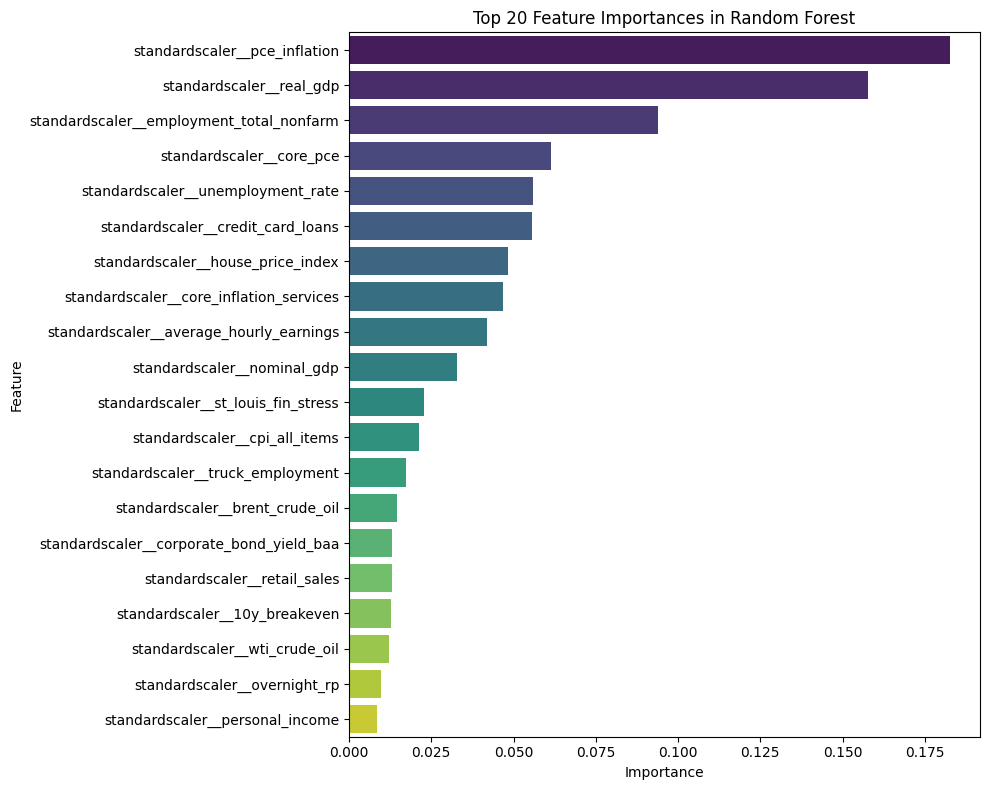

In [24]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns


df = pd.read_excel("final_combined_data_with_tariff.xlsx", index_col=0, parse_dates=True)


df['quarter'] = df.index.to_period('Q').astype(str).str[-2:]


df = df.dropna()


exclude = ['sp500', 'dow_jones','nasdaq','recession_flag', 'quarter'] + [
    'AAPL','MSFT','GOOGL','META','AMZN','NVDA','TSLA',
    'GC=F','CL=F','NG=F','ZW=F','ZC=F','ZS=F',
    '^IXIC','^GSPC','^DJI',
    'BTC-USD','ETH-USD','SOL-USD','BNB-USD','DOGE-USD'
]
macro_features = [col for col in df.columns if col not in exclude]


X = df[macro_features + ['quarter']]
y = df['sp500']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


cat_cols = ['quarter']
num_cols = [col for col in X.columns if col not in cat_cols]


preprocessor = make_column_transformer(
    (OneHotEncoder(drop='first'), cat_cols),
    (StandardScaler(), num_cols)
)


pipe = Pipeline([
    ('preprocessing', preprocessor),
    ('model', RandomForestRegressor(random_state=42))
])


param_grid = {
    'model__n_estimators': [100],
    'model__max_depth': [5, 10]
}

grid = GridSearchCV(pipe, param_grid, cv=5, scoring='neg_mean_squared_error')
grid.fit(X_train, y_train)


best_rf = grid.best_estimator_
y_train_pred = best_rf.predict(X_train)
y_test_pred = best_rf.predict(X_test)

train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)
r2 = r2_score(y_test, y_test_pred)

print(f"📊 Best Params: {grid.best_params_}")
print(f"📉 Train MSE: {train_mse:,.2f}")
print(f"📉 Test MSE: {test_mse:,.2f}")
print(f"📉 Train MAE: {train_mae:.2f}")
print(f"📉 Test MAE: {test_mae:.2f}")
print(f"📈 R²: {r2:.3f}")


fitted_transformer = best_rf.named_steps['preprocessing']
feature_names = fitted_transformer.get_feature_names_out()
importances = best_rf.named_steps['model'].feature_importances_


importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

print("\n📌 Feature Importance:")
display(importance_df)


plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=importance_df.head(20), palette='viridis')
plt.title('Top 20 Feature Importances in Random Forest')
plt.tight_layout()
plt.show()


Train MSE: 59.66
Test MSE: 112.75
Train MAE: 5.05
Test MAE: 7.80
R²: 1.000


<ipython-input-25-da10fe5f7d8a>:89: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=importance_df.head(25), palette='viridis')


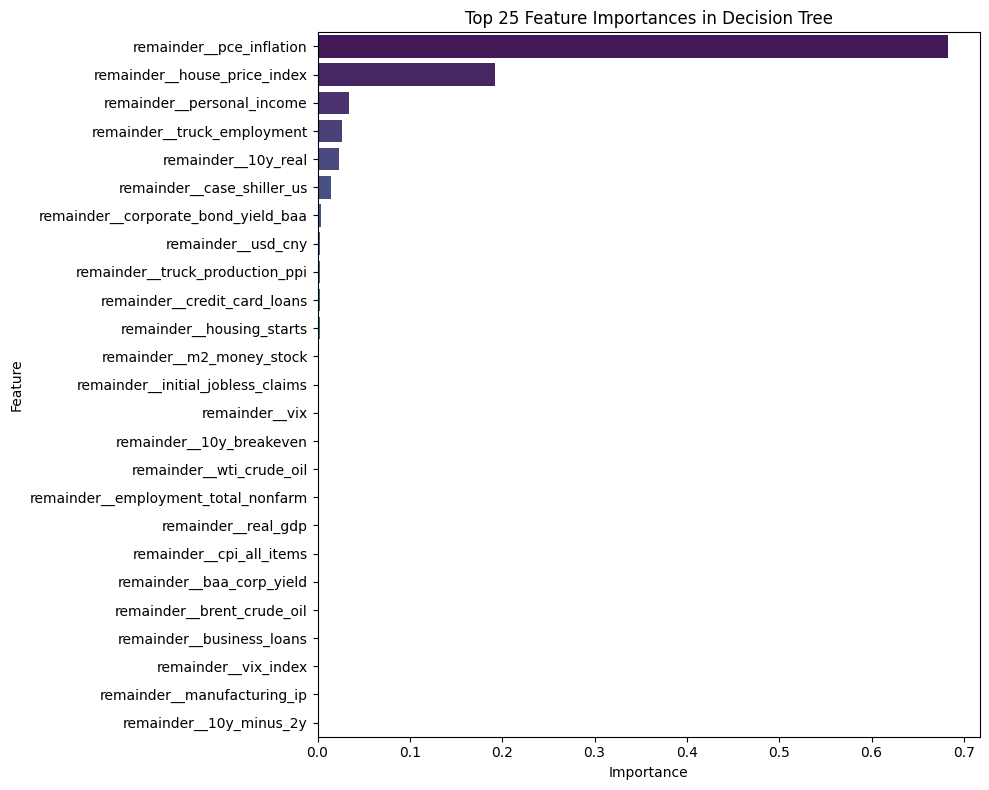

In [25]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns


df = pd.read_excel("final_combined_data_with_tariff.xlsx", index_col=0, parse_dates=True)


df = df.dropna()
df['quarter'] = df.index.to_period('Q').astype(str).str[-2:]


macro_cols = [
    col for col in df.columns if col not in ['sp500', 'dow_jones','nasdaq','recession_flag', 'quarter'] and not any(tk in col for tk in [
        'AAPL', 'MSFT', 'GOOGL', 'META', 'AMZN', 'NVDA', 'TSLA',
        'GC=F', 'CL=F', 'NG=F', 'ZW=F', 'ZC=F', 'ZS=F',
        '^IXIC', '^GSPC', '^DJI',
        'BTC-USD', 'ETH-USD', 'SOL-USD', 'BNB-USD', 'DOGE-USD'
    ])
]
X = df[macro_cols + ['quarter']]
y = df['sp500']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


cat_cols = ['quarter']
num_cols = [col for col in X.columns if col not in cat_cols]
transformer = make_column_transformer(
    (OneHotEncoder(drop='first'), cat_cols),
    remainder=StandardScaler()
)


pipe = Pipeline([
    ('preprocessing', transformer),
    ('model', DecisionTreeRegressor(random_state=42))
])


param_grid = {
    'model__max_depth': [3, 5, 8, 10],
    'model__min_samples_split': [2, 5],
    'model__min_samples_leaf': [1, 2]
}

grid = GridSearchCV(pipe, param_grid, cv=3, scoring='neg_mean_squared_error')
grid.fit(X_train, y_train)


best_tree = grid.best_estimator_
y_train_pred = best_tree.predict(X_train)
y_test_pred = best_tree.predict(X_test)

train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)
r2 = r2_score(y_test, y_test_pred)


print(f"Train MSE: {train_mse:,.2f}")
print(f"Test MSE: {test_mse:,.2f}")
print(f"Train MAE: {train_mae:.2f}")
print(f"Test MAE: {test_mae:.2f}")
print(f"R²: {r2:.3f}")


encoder = best_tree.named_steps['preprocessing']
feature_names = encoder.get_feature_names_out()
importances = best_tree.named_steps['model'].feature_importances_

importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=importance_df.head(25), palette='viridis')
plt.title("Top 25 Feature Importances in Decision Tree")
plt.tight_layout()
plt.show()


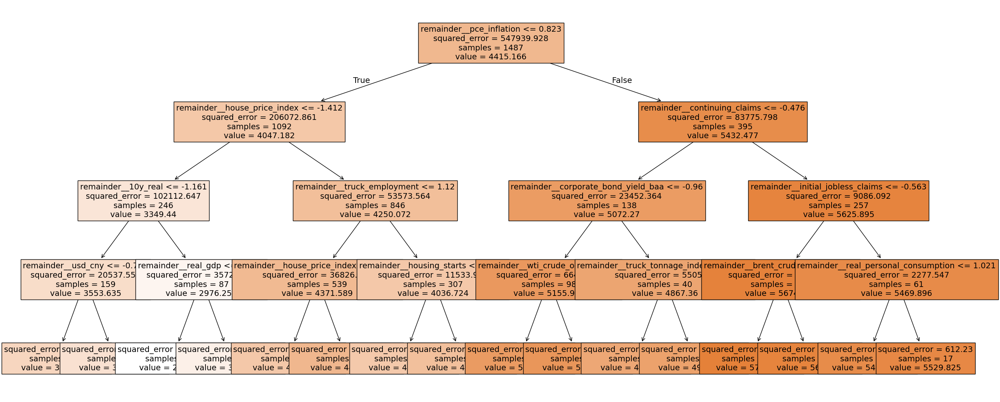

In [26]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


df = pd.read_excel("final_combined_data_with_tariff.xlsx", index_col=0, parse_dates=True)


df['quarter'] = df.index.to_period('Q').astype(str).str[-2:]


df = df.dropna()


exclude_cols = [
    'sp500', 'dow_jones','nasdaq','recession_flag', 'quarter'
] + [col for col in df.columns if any(tk in col for tk in [
    'AAPL','MSFT','GOOGL','META','AMZN','NVDA','TSLA',
    'GC=F','CL=F','NG=F','ZW=F','ZC=F','ZS=F',
    '^IXIC','^GSPC','^DJI',
    'BTC-USD','ETH-USD','SOL-USD','BNB-USD','DOGE-USD'
])]

macro_cols = [col for col in df.columns if col not in exclude_cols]
X = df[macro_cols + ['quarter']]
y = df['sp500']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


cat_cols = ['quarter']
num_cols = [col for col in X.columns if col not in cat_cols]


transformer = make_column_transformer(
    (OneHotEncoder(drop='first'), cat_cols),
    remainder=StandardScaler()
)


pipe = Pipeline([
    ('preprocessing', transformer),
    ('model', DecisionTreeRegressor(max_depth=4, random_state=42))
])
pipe.fit(X_train, y_train)


plt.figure(figsize=(25, 10))
plot_tree(
    pipe.named_steps['model'],
    feature_names=pipe.named_steps['preprocessing'].get_feature_names_out().tolist(),
    filled=True,
    fontsize=14
)
plt.tight_layout()
plt.show()


In [27]:
import pandas as pd
import numpy as np
from sklearn.dummy import DummyRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split


df = pd.read_excel("final_combined_data_with_tariff.xlsx", index_col=0, parse_dates=True)


df['quarter'] = df.index.to_period('Q').astype(str).str[-2:]


df = df.dropna()


macro_cols = [
    col for col in df.columns if col not in ['sp500', 'dow_jones','nasdaq','recession_flag', 'quarter'] and not any(tk in col for tk in [
        'AAPL','MSFT','GOOGL','META','AMZN','NVDA','TSLA',
        'GC=F','CL=F','NG=F','ZW=F','ZC=F','ZS=F',
        '^IXIC','^GSPC','^DJI',
        'BTC-USD','ETH-USD','SOL-USD','BNB-USD','DOGE-USD'
    ])
]

X = df[macro_cols]
y = df['sp500']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


baseline = DummyRegressor(strategy='mean')
baseline.fit(X_train, y_train)


y_pred = baseline.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)


print("📉 Baseline Model Performance:")
print(f"RMSE: {rmse:.2f}")
print(f"MAE: {mae:.2f}")
print(f"R²: {r2:.4f}")


📉 Baseline Model Performance:
RMSE: 744.87
MAE: 588.18
R²: -0.0046


In [28]:
X_test['quarter'] = df.loc[X_test.index, 'quarter']

print(X_test.columns)


Index(['unemployment_rate', 'cpi_all_items', 'core_pce', 'real_gdp',
       'nominal_gdp', 'federal_funds_rate', '10y_treasury_yield',
       '3m_treasury_yield', 'm2_money_stock', 'initial_jobless_claims',
       'continuing_claims', 'average_hourly_earnings',
       'employment_total_nonfarm', 'case_shiller_us', 'house_price_index',
       'housing_starts', 'total_vehicle_sales', 'wti_crude_oil',
       'brent_crude_oil', 'us_dollar_index', 'usd_jpy', 'usd_eur', 'usd_cny',
       'vix_index', 'pce_inflation', 'personal_income', 'retail_sales',
       'industrial_production', 'manufacturing_ip', 'capacity_utilization',
       'business_loans', 'credit_card_loans', 'consumer_sentiment',
       'truck_employment', 'truck_tonnage_index', 'heavy_truck_sales',
       'truck_production_ppi', 'used_cars_cpi', 'corporate_bond_yield_baa',
       'real_disposable_income', 'real_personal_consumption',
       'personal_savings_rate', 'st_louis_fin_stress',
       'core_inflation_services', 'prime

<ipython-input-29-aeb8605fdced>:44: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


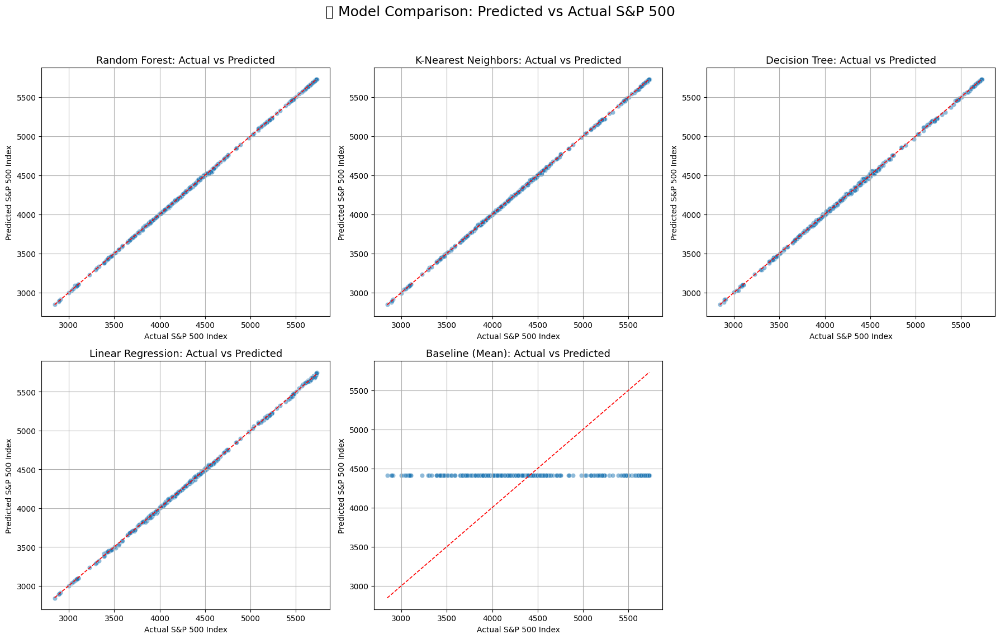

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns


y_pred_rf = best_rf.predict(X_test)
y_pred_knn = best_knn.predict(X_test)
y_pred_dt = best_tree.predict(X_test)
y_pred_lr = linreg_pipe.predict(X_test)
y_pred_baseline = baseline.predict(X_test)


model_predictions = {
    "Random Forest": y_pred_rf,
    "K-Nearest Neighbors": y_pred_knn,
    "Decision Tree": y_pred_dt,
    "Linear Regression": y_pred_lr,
    "Baseline (Mean)": y_pred_baseline
}


def plot_model_predictions_vs_actual(y_true, predictions_dict):
    n_models = len(predictions_dict)
    n_cols = 3
    n_rows = (n_models + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 6 * n_rows))
    axes = axes.flatten()

    for idx, (model_name, y_pred) in enumerate(predictions_dict.items()):
        sns.scatterplot(x=y_true, y=y_pred, alpha=0.5, ax=axes[idx])
        axes[idx].plot([y_true.min(), y_true.max()],
                       [y_true.min(), y_true.max()],
                       'r--', linewidth=1.2)
        axes[idx].set_title(f"{model_name}: Actual vs Predicted", fontsize=13)
        axes[idx].set_xlabel("Actual S&P 500 Index")
        axes[idx].set_ylabel("Predicted S&P 500 Index")
        axes[idx].grid(True)


    for j in range(idx + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle("📊 Model Comparison: Predicted vs Actual S&P 500", fontsize=18)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


plot_model_predictions_vs_actual(y_test, model_predictions)


<ipython-input-30-490fc202f376>:43: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])


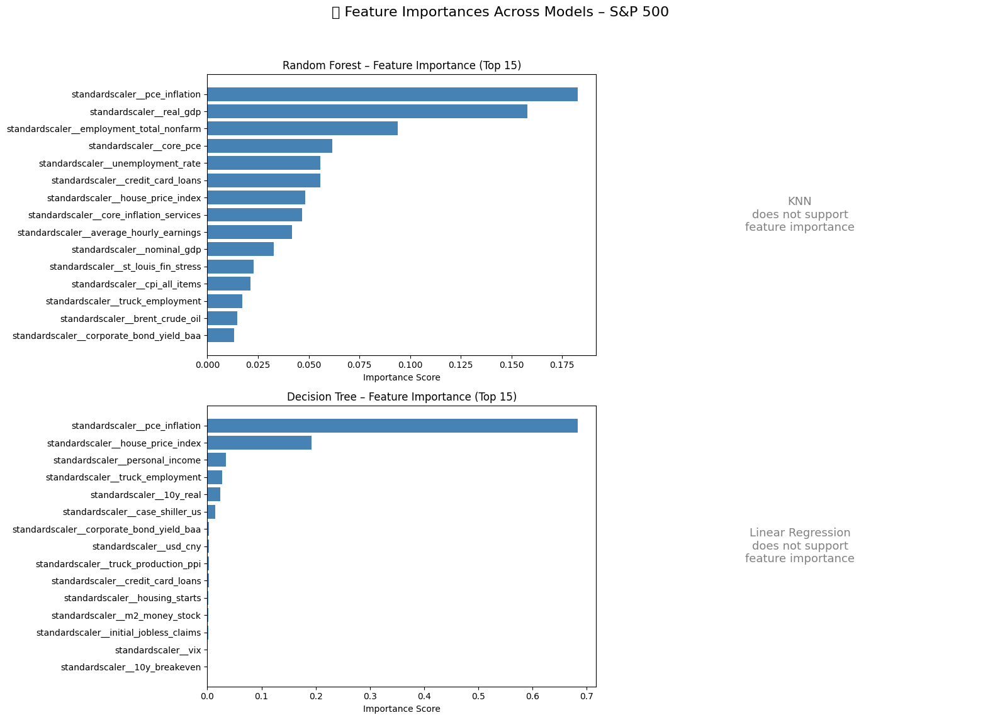

In [30]:
import matplotlib.pyplot as plt
import numpy as np


rf_importances = best_rf.named_steps['model'].feature_importances_
dt_importances = best_tree.named_steps['model'].feature_importances_


feature_names = best_rf.named_steps['preprocessing'].get_feature_names_out()


models = ['Random Forest', 'KNN', 'Decision Tree', 'Linear Regression']
importances = {
    'Random Forest': rf_importances,
    'KNN': None,
    'Decision Tree': dt_importances,
    'Linear Regression': None
}


fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for idx, model in enumerate(models):
    ax = axes[idx]
    if importances[model] is not None:
        sorted_idx = np.argsort(importances[model])[::-1][:15]
        ax.barh(
            np.array(feature_names)[sorted_idx],
            importances[model][sorted_idx],
            color='steelblue'
        )
        ax.set_title(f'{model} – Feature Importance (Top 15)', fontsize=12)
        ax.set_xlabel("Importance Score")
        ax.invert_yaxis()
    else:
        ax.text(0.5, 0.5, f'{model}\ndoes not support\nfeature importance',
                horizontalalignment='center', verticalalignment='center',
                fontsize=13, color='gray')
        ax.set_axis_off()

plt.suptitle("📊 Feature Importances Across Models – S&P 500", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


<ipython-input-32-6cd4fa0b8c5b>:51: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


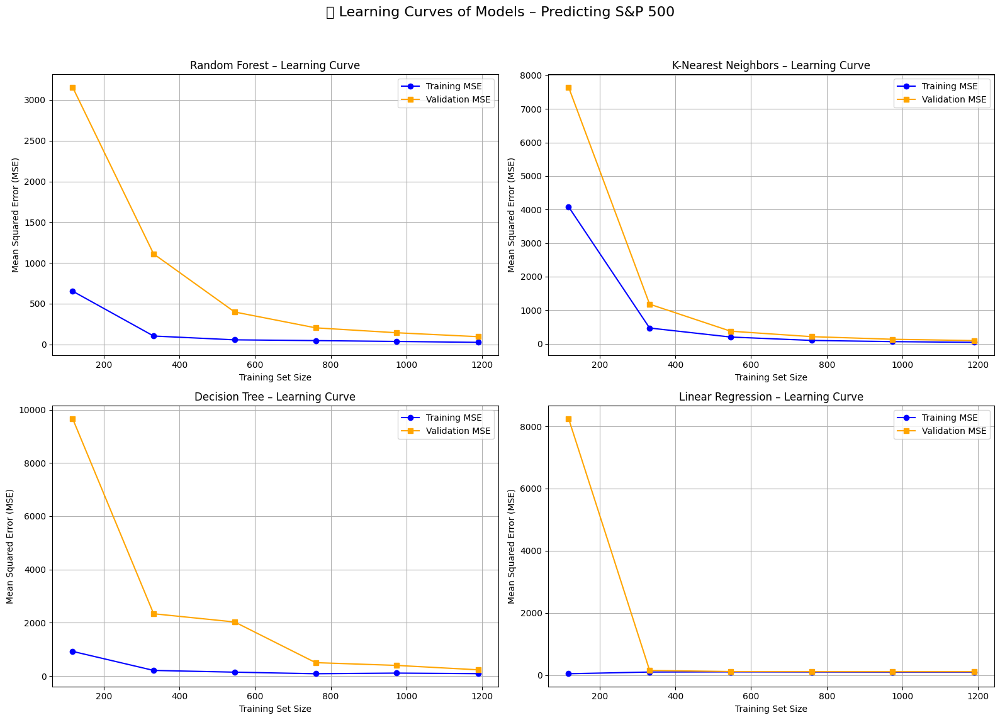

In [32]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import learning_curve


def plot_learning_curves(models_dict, X, y):

    required_columns = set()
    for model_name, model_pipeline in models_dict.items():
        if hasattr(model_pipeline.named_steps['preprocessing'], 'transformers'):
            for transformer in model_pipeline.named_steps['preprocessing'].transformers:
                cols = transformer[2]
                if isinstance(cols, list):
                    required_columns.update(cols)
                elif isinstance(cols, str):
                    required_columns.add(cols)

    missing = required_columns - set(X.columns)
    if missing:
        raise ValueError(f"❌ X is missing required columns used by one or more models: {missing}")

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()

    for idx, (model_name, model_pipeline) in enumerate(models_dict.items()):
        train_sizes, train_scores, test_scores = learning_curve(
            model_pipeline,
            X, y,
            cv=5,
            scoring='neg_mean_squared_error',
            train_sizes=np.linspace(0.1, 1.0, 6),
            n_jobs=-1
        )

        train_scores_mean = -np.mean(train_scores, axis=1)
        test_scores_mean = -np.mean(test_scores, axis=1)

        axes[idx].plot(train_sizes, train_scores_mean, label="Training MSE", color='blue', marker='o')
        axes[idx].plot(train_sizes, test_scores_mean, label="Validation MSE", color='orange', marker='s')
        axes[idx].set_title(f"{model_name} – Learning Curve", fontsize=12)
        axes[idx].set_xlabel("Training Set Size")
        axes[idx].set_ylabel("Mean Squared Error (MSE)")
        axes[idx].legend()
        axes[idx].grid(True)


    for j in range(len(models_dict), len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle("📈 Learning Curves of Models – Predicting S&P 500", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()



macro_cols = [col for col in df.columns if col not in ['sp500', 'dow_jones','nasdaq','recession_flag', 'quarter'] and not any(tk in col for tk in [
    'AAPL', 'MSFT', 'GOOGL', 'META', 'AMZN', 'NVDA', 'TSLA',
    'GC=F', 'CL=F', 'NG=F', 'ZW=F', 'ZC=F', 'ZS=F',
    '^IXIC', '^GSPC', '^DJI',
    'BTC-USD', 'ETH-USD', 'SOL-USD', 'BNB-USD', 'DOGE-USD'
])]
X = df[macro_cols + ['quarter']]
y = df['sp500']


from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


models_dict = {
    "Random Forest": best_rf,
    "K-Nearest Neighbors": best_knn,
    "Decision Tree": best_tree,
    "Linear Regression": linreg_pipe
}


plot_learning_curves(models_dict, X_train, y_train)


In [33]:

import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


file_path = "final_combined_data_with_tariff.xlsx"
df = pd.read_excel(file_path, index_col=0, parse_dates=True)


target = 'core_pce'


monetary_features = [
    'federal_funds_rate', 'prime_rate', 'federal_funds_effective',
    'm2_money_stock', 'overnight_rp', 'sofr_30d_avg',
    '10y_treasury_yield', '3m_treasury_yield', '10y_breakeven', '5y5y_forward_infl'
]


df_month = df.dropna(subset=monetary_features + [target]).copy()
df_month['target_next_month'] = df_month[target].shift(-1)
df_month = df_month.dropna(subset=['target_next_month'])

X_month = df_month[monetary_features]
y_month = df_month['target_next_month']


X_train_m, X_test_m, y_train_m, y_test_m = train_test_split(
    X_month, y_month, test_size=0.2, random_state=42, shuffle=False
)


pipe_limited = Pipeline([
    ('scaler', StandardScaler()),
    ('rf', RandomForestRegressor(n_estimators=1000, max_depth=5, random_state=42))
])


pipe_limited.fit(X_train_m, y_train_m)
y_pred_m = pipe_limited.predict(X_test_m)


mse_m = mean_squared_error(y_test_m, y_pred_m)
mae_m = mean_absolute_error(y_test_m, y_pred_m)
r2_m = r2_score(y_test_m, y_pred_m)

mse_m, mae_m, r2_m


(25.47566502641388, 4.435162041829321, -14.978097731618014)

<ipython-input-34-1d047c812a8c>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances[sorted_idx], y=np.array(feature_names)[sorted_idx], palette="Blues_r")


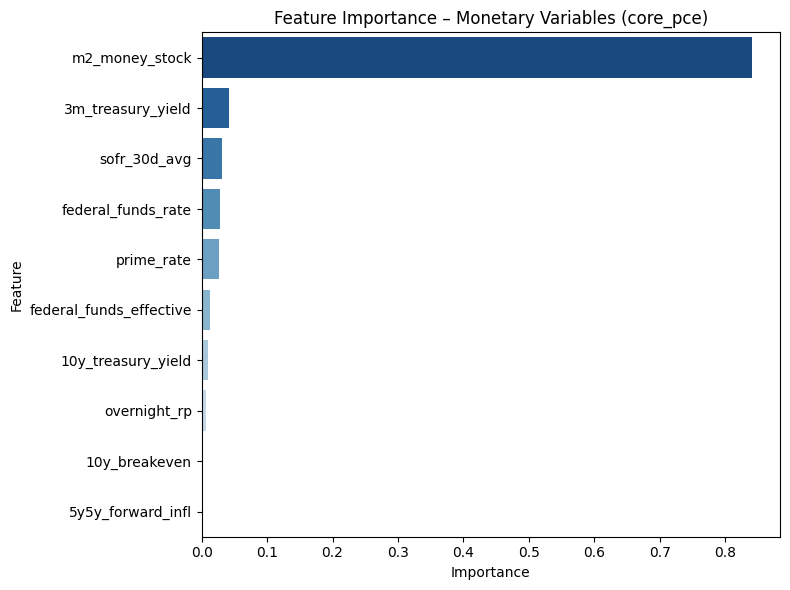

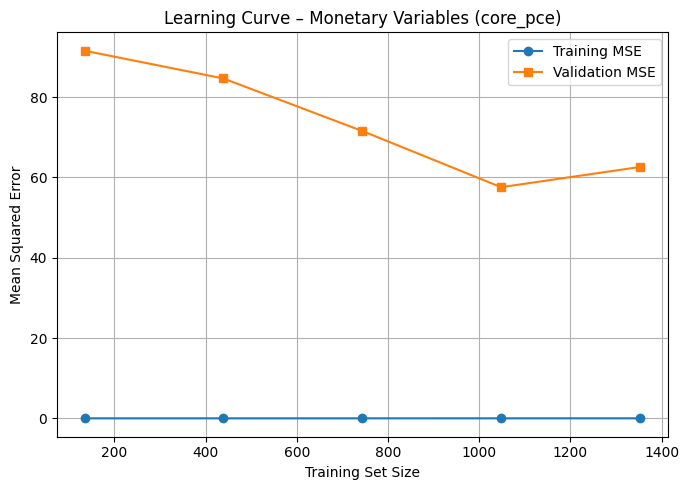

In [34]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, learning_curve
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


file_path = "final_combined_data_with_tariff.xlsx"
df = pd.read_excel(file_path, index_col=0, parse_dates=True)


target = 'core_pce'
monetary_features = [
    'federal_funds_rate', 'prime_rate', 'federal_funds_effective',
    'm2_money_stock', 'overnight_rp', 'sofr_30d_avg',
    '10y_treasury_yield', '3m_treasury_yield', '10y_breakeven', '5y5y_forward_infl'
]


df_month = df.dropna(subset=monetary_features + [target]).copy()
df_month['target_next_month'] = df_month[target].shift(-1)
df_month = df_month.dropna(subset=['target_next_month'])

X_month = df_month[monetary_features]
y_month = df_month['target_next_month']


X_train_m, X_test_m, y_train_m, y_test_m = train_test_split(
    X_month, y_month, test_size=0.2, random_state=42, shuffle=False
)


pipe_limited = Pipeline([
    ('scaler', StandardScaler()),
    ('rf', RandomForestRegressor(n_estimators=1000, max_depth=5, random_state=42))
])
pipe_limited.fit(X_train_m, y_train_m)


def plot_feature_importance_en(pipe, feature_names, title):
    importances = pipe.named_steps['rf'].feature_importances_
    sorted_idx = np.argsort(importances)[::-1]
    plt.figure(figsize=(8, 6))
    sns.barplot(x=importances[sorted_idx], y=np.array(feature_names)[sorted_idx], palette="Blues_r")
    plt.title(f"Feature Importance – {title}")
    plt.xlabel("Importance")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()

def plot_learning_curve_model_en(pipe, X, y, title):
    train_sizes, train_scores, test_scores = learning_curve(
        pipe, X, y, cv=3, scoring='neg_mean_squared_error',
        train_sizes=np.linspace(0.1, 1.0, 5), n_jobs=-1, shuffle=False
    )
    train_scores_mean = -np.mean(train_scores, axis=1)
    test_scores_mean = -np.mean(test_scores, axis=1)

    plt.figure(figsize=(7, 5))
    plt.plot(train_sizes, train_scores_mean, label="Training MSE", marker='o')
    plt.plot(train_sizes, test_scores_mean, label="Validation MSE", marker='s')
    plt.title(f"Learning Curve – {title}")
    plt.xlabel("Training Set Size")
    plt.ylabel("Mean Squared Error")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


plot_feature_importance_en(pipe_limited, monetary_features, "Monetary Variables (core_pce)")
plot_learning_curve_model_en(pipe_limited, X_train_m, y_train_m, "Monetary Variables (core_pce)")


<ipython-input-35-1091942e9ee9>:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances[sorted_idx], y=np.array(feature_names)[sorted_idx], palette="Blues_r")


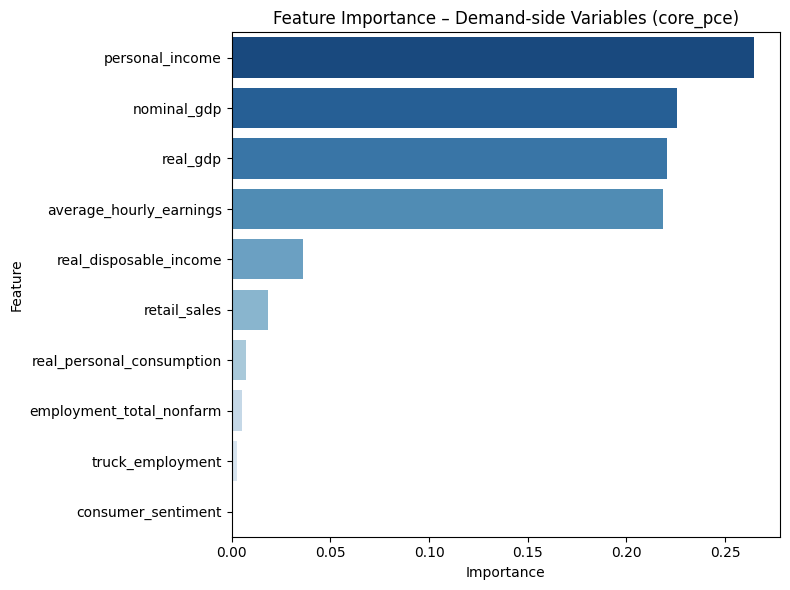

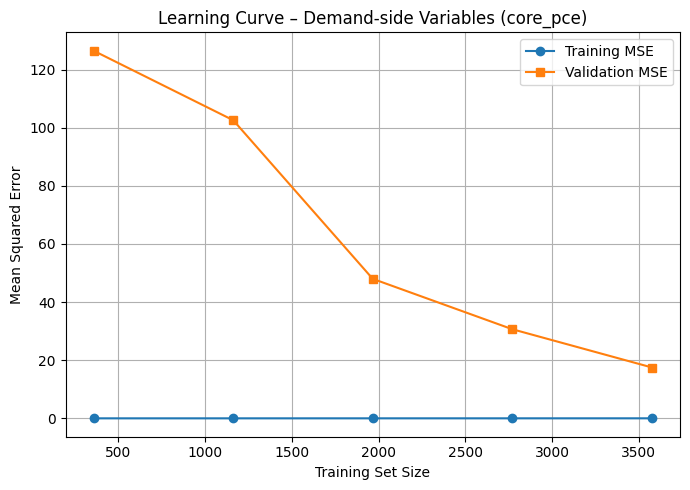

(110.37853548163366, 9.558684710450722, -4.806315563061193)

In [35]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, learning_curve
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


file_path = "final_combined_data_with_tariff.xlsx"
df = pd.read_excel(file_path, index_col=0, parse_dates=True)


target = 'core_pce'


demand_features = [
    'real_gdp', 'nominal_gdp', 'retail_sales', 'personal_income',
    'real_disposable_income', 'real_personal_consumption',
    'consumer_sentiment', 'employment_total_nonfarm',
    'average_hourly_earnings', 'truck_employment'
]


df_demand = df.dropna(subset=demand_features + [target]).copy()
df_demand['target_next_month'] = df_demand[target].shift(-1)
df_demand = df_demand.dropna(subset=['target_next_month'])

X_demand = df_demand[demand_features]
y_demand = df_demand['target_next_month']


X_train_d, X_test_d, y_train_d, y_test_d = train_test_split(
    X_demand, y_demand, test_size=0.2, random_state=42, shuffle=False
)


pipe_demand = Pipeline([
    ('scaler', StandardScaler()),
    ('rf', RandomForestRegressor(n_estimators=1000, max_depth=5, random_state=42))
])
pipe_demand.fit(X_train_d, y_train_d)
y_pred_d = pipe_demand.predict(X_test_d)


mse_d = mean_squared_error(y_test_d, y_pred_d)
mae_d = mean_absolute_error(y_test_d, y_pred_d)
r2_d = r2_score(y_test_d, y_pred_d)


def plot_feature_importance_en(pipe, feature_names, title):
    importances = pipe.named_steps['rf'].feature_importances_
    sorted_idx = np.argsort(importances)[::-1]
    plt.figure(figsize=(8, 6))
    sns.barplot(x=importances[sorted_idx], y=np.array(feature_names)[sorted_idx], palette="Blues_r")
    plt.title(f"Feature Importance – {title}")
    plt.xlabel("Importance")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()

def plot_learning_curve_model_en(pipe, X, y, title):
    train_sizes, train_scores, test_scores = learning_curve(
        pipe, X, y, cv=3, scoring='neg_mean_squared_error',
        train_sizes=np.linspace(0.1, 1.0, 5), n_jobs=-1, shuffle=False
    )
    train_scores_mean = -np.mean(train_scores, axis=1)
    test_scores_mean = -np.mean(test_scores, axis=1)

    plt.figure(figsize=(7, 5))
    plt.plot(train_sizes, train_scores_mean, label="Training MSE", marker='o')
    plt.plot(train_sizes, test_scores_mean, label="Validation MSE", marker='s')
    plt.title(f"Learning Curve – {title}")
    plt.xlabel("Training Set Size")
    plt.ylabel("Mean Squared Error")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


plot_feature_importance_en(pipe_demand, demand_features, "Demand-side Variables (core_pce)")
plot_learning_curve_model_en(pipe_demand, X_train_d, y_train_d, "Demand-side Variables (core_pce)")

mse_d, mae_d, r2_d


<ipython-input-36-af6a7e08ef1d>:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances[sorted_idx], y=np.array(feature_names)[sorted_idx], palette="Blues_r")


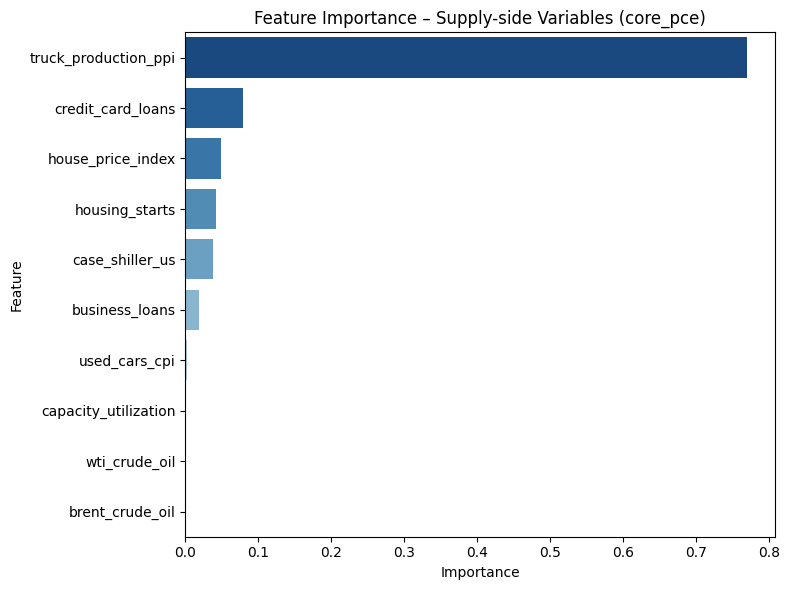

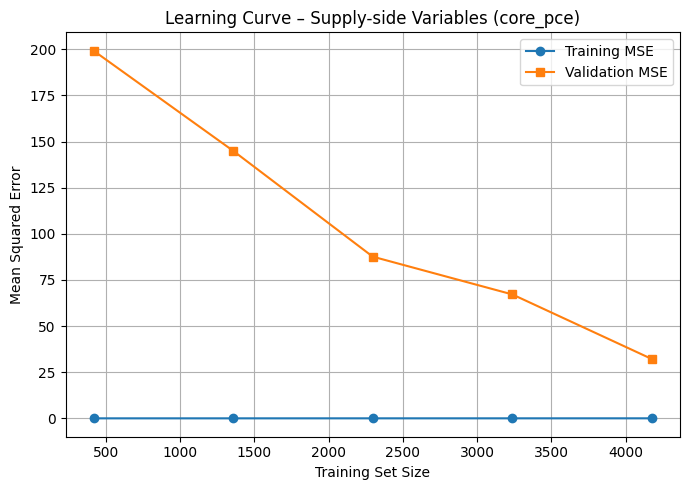

(181.08946920838918, 12.26368618478693, -4.982591423769458)

In [36]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, learning_curve
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


file_path = "final_combined_data_with_tariff.xlsx"
df = pd.read_excel(file_path, index_col=0, parse_dates=True)


target = 'core_pce'


supply_features = [
    'wti_crude_oil', 'brent_crude_oil', 'used_cars_cpi',
    'truck_production_ppi', 'housing_starts',
    'case_shiller_us', 'house_price_index',
    'business_loans', 'credit_card_loans', 'capacity_utilization'
]


df_supply = df.dropna(subset=supply_features + [target]).copy()
df_supply['target_next_month'] = df_supply[target].shift(-1)
df_supply = df_supply.dropna(subset=['target_next_month'])

X_supply = df_supply[supply_features]
y_supply = df_supply['target_next_month']


X_train_s, X_test_s, y_train_s, y_test_s = train_test_split(
    X_supply, y_supply, test_size=0.2, random_state=42, shuffle=False
)


pipe_supply = Pipeline([
    ('scaler', StandardScaler()),
    ('rf', RandomForestRegressor(n_estimators=100, max_depth=5, random_state=42))
])
pipe_supply.fit(X_train_s, y_train_s)
y_pred_s = pipe_supply.predict(X_test_s)


mse_s = mean_squared_error(y_test_s, y_pred_s)
mae_s = mean_absolute_error(y_test_s, y_pred_s)
r2_s = r2_score(y_test_s, y_pred_s)


def plot_feature_importance_en(pipe, feature_names, title):
    importances = pipe.named_steps['rf'].feature_importances_
    sorted_idx = np.argsort(importances)[::-1]
    plt.figure(figsize=(8, 6))
    sns.barplot(x=importances[sorted_idx], y=np.array(feature_names)[sorted_idx], palette="Blues_r")
    plt.title(f"Feature Importance – {title}")
    plt.xlabel("Importance")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()

def plot_learning_curve_model_en(pipe, X, y, title):
    train_sizes, train_scores, test_scores = learning_curve(
        pipe, X, y, cv=3, scoring='neg_mean_squared_error',
        train_sizes=np.linspace(0.1, 1.0, 5), n_jobs=-1, shuffle=False
    )
    train_scores_mean = -np.mean(train_scores, axis=1)
    test_scores_mean = -np.mean(test_scores, axis=1)

    plt.figure(figsize=(7, 5))
    plt.plot(train_sizes, train_scores_mean, label="Training MSE", marker='o')
    plt.plot(train_sizes, test_scores_mean, label="Validation MSE", marker='s')
    plt.title(f"Learning Curve – {title}")
    plt.xlabel("Training Set Size")
    plt.ylabel("Mean Squared Error")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


plot_feature_importance_en(pipe_supply, supply_features, "Supply-side Variables (core_pce)")
plot_learning_curve_model_en(pipe_supply, X_train_s, y_train_s, "Supply-side Variables (core_pce)")


mse_s, mae_s, r2_s


<ipython-input-37-d5b3856851ef>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances[sorted_idx][:20], y=np.array(feature_names)[sorted_idx][:20], palette="Blues_r")


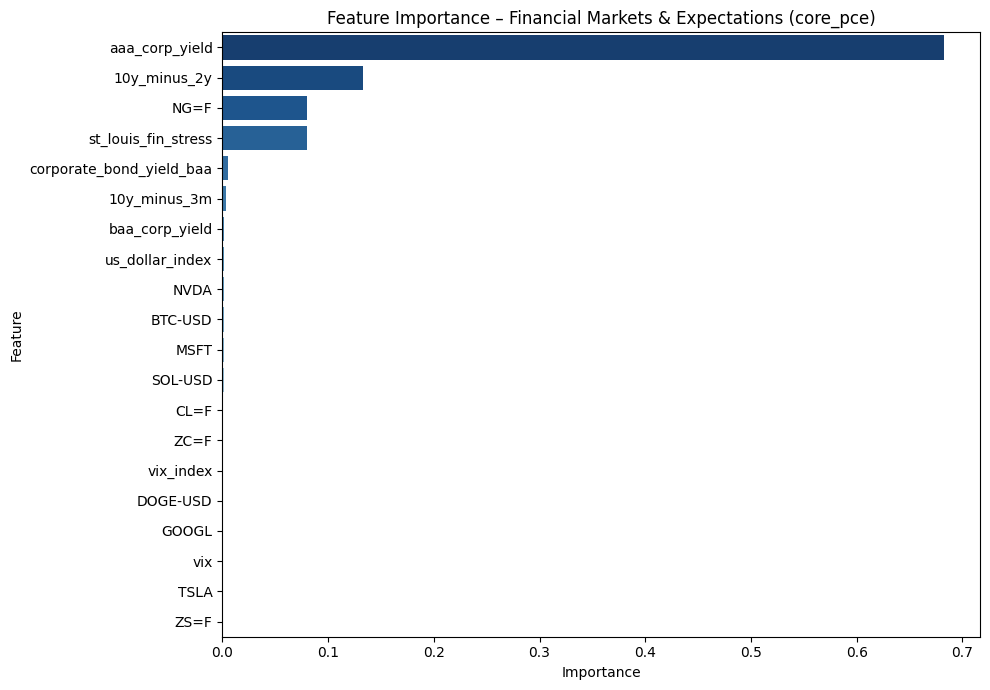

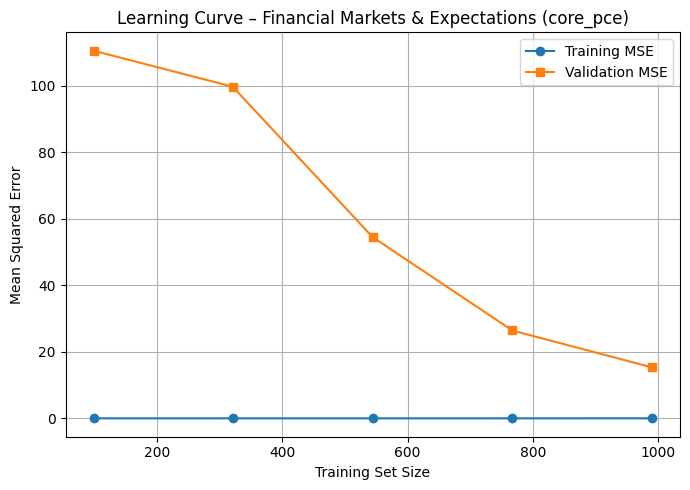

(25.353195374087296, 3.7433473388140137, -27.360760403049767)

In [37]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, learning_curve
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


file_path = "final_combined_data_with_tariff.xlsx"
df = pd.read_excel(file_path, index_col=0, parse_dates=True)


target = 'core_pce'


expectation_features = [
    'vix', 'vix_index', 'us_dollar_index', 'usd_index_nominal',
    'st_louis_fin_stress', '10y_minus_2y', '10y_minus_3m',
    'aaa_corp_yield', 'baa_corp_yield', 'corporate_bond_yield_baa',
    'BTC-USD', 'ETH-USD', 'SOL-USD', 'BNB-USD', 'DOGE-USD',
    'GC=F', 'CL=F', 'NG=F', 'ZW=F', 'ZC=F', 'ZS=F',
    'AAPL', 'MSFT', 'GOOGL', 'META', 'AMZN', 'NVDA', 'TSLA'
]


df_expect = df.dropna(subset=expectation_features + [target]).copy()
df_expect['target_next_month'] = df_expect[target].shift(-1)
df_expect = df_expect.dropna(subset=['target_next_month'])

X_expect = df_expect[expectation_features]
y_expect = df_expect['target_next_month']


X_train_e, X_test_e, y_train_e, y_test_e = train_test_split(
    X_expect, y_expect, test_size=0.2, random_state=42, shuffle=False
)


pipe_expect = Pipeline([
    ('scaler', StandardScaler()),
    ('rf', RandomForestRegressor(n_estimators=100, max_depth=5, random_state=42))
])
pipe_expect.fit(X_train_e, y_train_e)
y_pred_e = pipe_expect.predict(X_test_e)


def plot_feature_importance_en(pipe, feature_names, title):
    importances = pipe.named_steps['rf'].feature_importances_
    sorted_idx = np.argsort(importances)[::-1]
    plt.figure(figsize=(10, 7))
    sns.barplot(x=importances[sorted_idx][:20], y=np.array(feature_names)[sorted_idx][:20], palette="Blues_r")
    plt.title(f"Feature Importance – {title}")
    plt.xlabel("Importance")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()

def plot_learning_curve_model_en(pipe, X, y, title):
    train_sizes, train_scores, test_scores = learning_curve(
        pipe, X, y, cv=3, scoring='neg_mean_squared_error',
        train_sizes=np.linspace(0.1, 1.0, 5), n_jobs=-1, shuffle=False
    )
    train_scores_mean = -np.mean(train_scores, axis=1)
    test_scores_mean = -np.mean(test_scores, axis=1)

    plt.figure(figsize=(7, 5))
    plt.plot(train_sizes, train_scores_mean, label="Training MSE", marker='o')
    plt.plot(train_sizes, test_scores_mean, label="Validation MSE", marker='s')
    plt.title(f"Learning Curve – {title}")
    plt.xlabel("Training Set Size")
    plt.ylabel("Mean Squared Error")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


plot_feature_importance_en(pipe_expect, expectation_features, "Financial Markets & Expectations (core_pce)")
plot_learning_curve_model_en(pipe_expect, X_train_e, y_train_e, "Financial Markets & Expectations (core_pce)")


mse_e = mean_squared_error(y_test_e, y_pred_e)
mae_e = mean_absolute_error(y_test_e, y_pred_e)
r2_e = r2_score(y_test_e, y_pred_e)

mse_e, mae_e, r2_e



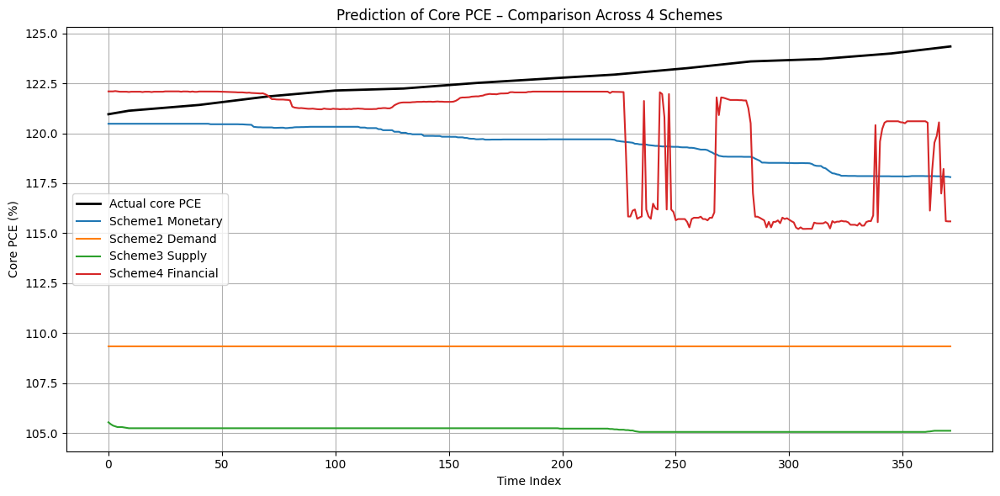

In [38]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split


file_path = "final_combined_data_with_tariff.xlsx"
df = pd.read_excel(file_path, index_col=0, parse_dates=True)


target = 'core_pce'


monetary_features = [
    'federal_funds_rate', 'prime_rate', 'federal_funds_effective',
    'm2_money_stock', 'overnight_rp', 'sofr_30d_avg',
    '10y_treasury_yield', '3m_treasury_yield', '10y_breakeven', '5y5y_forward_infl'
]
demand_features = [
    'real_gdp', 'nominal_gdp', 'retail_sales', 'personal_income',
    'real_disposable_income', 'real_personal_consumption',
    'consumer_sentiment', 'employment_total_nonfarm',
    'average_hourly_earnings', 'truck_employment'
]
supply_features = [
    'wti_crude_oil', 'brent_crude_oil', 'used_cars_cpi',
    'truck_production_ppi', 'housing_starts',
    'case_shiller_us', 'house_price_index',
    'business_loans', 'credit_card_loans', 'capacity_utilization'
]
expectation_features = [
    'vix', 'vix_index', 'us_dollar_index', 'usd_index_nominal',
    'st_louis_fin_stress', '10y_minus_2y', '10y_minus_3m',
    'aaa_corp_yield', 'baa_corp_yield', 'corporate_bond_yield_baa',
    'BTC-USD', 'ETH-USD', 'SOL-USD', 'BNB-USD', 'DOGE-USD',
    'GC=F', 'CL=F', 'NG=F', 'ZW=F', 'ZC=F', 'ZS=F',
    'AAPL', 'MSFT', 'GOOGL', 'META', 'AMZN', 'NVDA', 'TSLA'
]


def train_and_predict(df, features, target='core_pce'):
    df_clean = df.dropna(subset=features + [target]).copy()
    df_clean['target_next_month'] = df_clean[target].shift(-1)
    df_clean = df_clean.dropna(subset=['target_next_month'])

    X = df_clean[features]
    y = df_clean['target_next_month']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

    model = Pipeline([
        ('scaler', StandardScaler()),
        ('rf', RandomForestRegressor(n_estimators=100, max_depth=5, random_state=42))
    ])
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    return y_test.reset_index(drop=True), y_pred


y_test, y_pred_1 = train_and_predict(df, monetary_features)
_, y_pred_2 = train_and_predict(df, demand_features)
_, y_pred_3 = train_and_predict(df, supply_features)
_, y_pred_4 = train_and_predict(df, expectation_features)


min_len = min(len(y_test), len(y_pred_1), len(y_pred_2), len(y_pred_3), len(y_pred_4))


pred_df_all = pd.DataFrame({
    'Actual_core_pce': y_test[:min_len],
    'Scheme1_Monetary': y_pred_1[:min_len],
    'Scheme2_Demand': y_pred_2[:min_len],
    'Scheme3_Supply': y_pred_3[:min_len],
    'Scheme4_Financial': y_pred_4[:min_len]
})


plt.figure(figsize=(12, 6))
plt.plot(pred_df_all['Actual_core_pce'].values, label="Actual core PCE", color='black', linewidth=2)

for col in pred_df_all.columns[1:]:
    plt.plot(pred_df_all[col].values, label=col.replace("_", " "))

plt.title("Prediction of Core PCE – Comparison Across 4 Schemes")
plt.xlabel("Time Index")
plt.ylabel("Core PCE (%)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


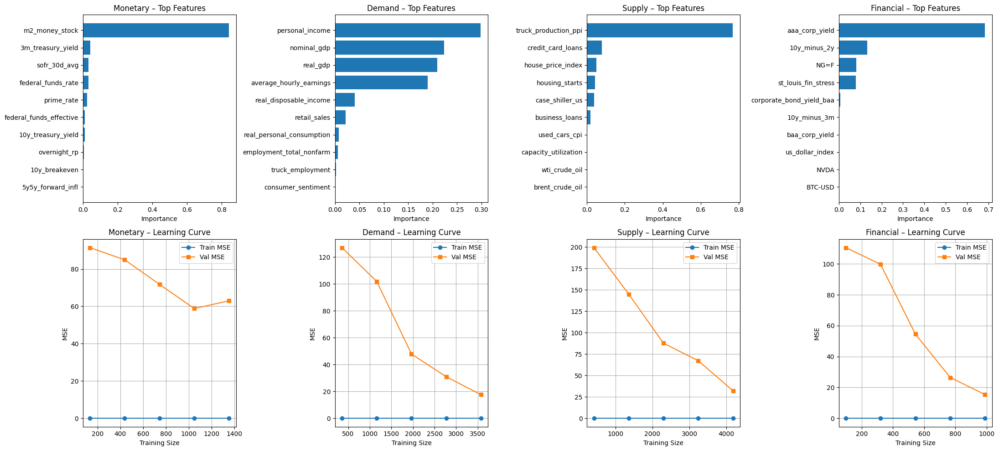

In [39]:


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, learning_curve


file_path = "final_combined_data_with_tariff.xlsx"
df = pd.read_excel(file_path, index_col=0, parse_dates=True)


target = 'core_pce'


monetary_features = [
    'federal_funds_rate', 'prime_rate', 'federal_funds_effective',
    'm2_money_stock', 'overnight_rp', 'sofr_30d_avg',
    '10y_treasury_yield', '3m_treasury_yield', '10y_breakeven', '5y5y_forward_infl'
]
demand_features = [
    'real_gdp', 'nominal_gdp', 'retail_sales', 'personal_income',
    'real_disposable_income', 'real_personal_consumption',
    'consumer_sentiment', 'employment_total_nonfarm',
    'average_hourly_earnings', 'truck_employment'
]
supply_features = [
    'wti_crude_oil', 'brent_crude_oil', 'used_cars_cpi',
    'truck_production_ppi', 'housing_starts',
    'case_shiller_us', 'house_price_index',
    'business_loans', 'credit_card_loans', 'capacity_utilization'
]
expectation_features = [
    'vix', 'vix_index', 'us_dollar_index', 'usd_index_nominal',
    'st_louis_fin_stress', '10y_minus_2y', '10y_minus_3m',
    'aaa_corp_yield', 'baa_corp_yield', 'corporate_bond_yield_baa',
    'BTC-USD', 'ETH-USD', 'SOL-USD', 'BNB-USD', 'DOGE-USD',
    'GC=F', 'CL=F', 'NG=F', 'ZW=F', 'ZC=F', 'ZS=F',
    'AAPL', 'MSFT', 'GOOGL', 'META', 'AMZN', 'NVDA', 'TSLA'
]


models_info = [
    ("Monetary", monetary_features),
    ("Demand", demand_features),
    ("Supply", supply_features),
    ("Financial", expectation_features)
]

trained_pipes = []
X_trains = []
y_trains = []

for name, features in models_info:
    df_clean = df.dropna(subset=features + [target]).copy()
    df_clean['target_next_month'] = df_clean[target].shift(-1)
    df_clean = df_clean.dropna(subset=['target_next_month'])

    X = df_clean[features]
    y = df_clean['target_next_month']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

    pipe = Pipeline([
        ('scaler', StandardScaler()),
        ('rf', RandomForestRegressor(n_estimators=100, max_depth=5, random_state=42))
    ])
    pipe.fit(X_train, y_train)

    trained_pipes.append((name, pipe, features))
    X_trains.append(X_train)
    y_trains.append(y_train)


fig, axes = plt.subplots(2, 4, figsize=(22, 10))

for i, (name, pipe, features) in enumerate(trained_pipes):
    importances = pipe.named_steps['rf'].feature_importances_
    sorted_idx = np.argsort(importances)[::-1]
    top_n = 10 if len(features) > 10 else len(features)
    top_idx = sorted_idx[:top_n]
    axes[0, i].barh(np.array(features)[top_idx][::-1], importances[top_idx][::-1])
    axes[0, i].set_title(f"{name} – Top Features")
    axes[0, i].set_xlabel("Importance")

    train_sizes, train_scores, test_scores = learning_curve(
        pipe, X_trains[i], y_trains[i], cv=3, scoring='neg_mean_squared_error',
        train_sizes=np.linspace(0.1, 1.0, 5), n_jobs=-1, shuffle=False
    )
    train_scores_mean = -np.mean(train_scores, axis=1)
    test_scores_mean = -np.mean(test_scores, axis=1)

    axes[1, i].plot(train_sizes, train_scores_mean, label="Train MSE", marker='o')
    axes[1, i].plot(train_sizes, test_scores_mean, label="Val MSE", marker='s')
    axes[1, i].set_title(f"{name} – Learning Curve")
    axes[1, i].set_xlabel("Training Size")
    axes[1, i].set_ylabel("MSE")
    axes[1, i].legend()
    axes[1, i].grid(True)

plt.tight_layout()
plt.show()
